## Visualization using Google Earth Engine
#### Author: Ann-Sofie Zinck (a.p.zinck@uu.nl)
Based on Philipp Arndt's tutorial and using a modification of his oa.py

In [1]:
%matplotlib widget
import os
import ee
import geemap
import requests
import numpy as np
import matplotlib.pylab as plt
from datetime import datetime
from datetime import timedelta
import rasterio as rio
from rasterio import plot
from rasterio import warp
import pandas as pd
from ipyleaflet import basemaps, basemap_to_tiles

from oa_PA_ASZ import dataCollector

In [2]:
try:
    ee.Initialize()
except: 
    ee.Authenticate()
    ee.Initialize()

Use open altimetry to find the desired track

In [3]:
PIG_20210127_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2021-01-27&minx=-101.05618280606095&miny=-75.07153639057141&maxx=-100.19763809126549&maxy=-74.74493366712844&trackId=523&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&beamName=gt1r&beamName=gt1l&outputFormat=json'
PIG_20210127_gtx = 'gt3r'

PIG_20201007_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2020-10-07&minx=-101.06993207685464&miny=-75.06319452393107&maxx=-100.2946192252&maxy=-74.74165227279721&trackId=210&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&beamName=gt1r&beamName=gt1l&outputFormat=json'
PIG_20201007_gtx = 'gt2r'

PIG_20201126_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2020-11-26&minx=-101.14052925449913&miny=-75.06448446439796&maxx=-99.96378551049133&maxy=-74.71181440450334&trackId=965&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&beamName=gt1r&beamName=gt1l&outputFormat=json'
PIG_20201126_gtx ='gt1l' 

In [4]:
# Slightly changed from Philipp Arndt's tutorial
# Here I present the option of including ATL07 and the option not to include ATL07 and 08 in the figures
def plot_from_oa_url(url,gtx,title='ICESat-2 Data',plot_atl07=True,plot_atl08=True):
    mydata = dataCollector(oaurl=url,beam=gtx)
    mydata.requestData()
    myplot = mydata.plotData(title=title,plot_atl07=plot_atl07,plot_atl08=plot_atl08)
    return (myplot, mydata)

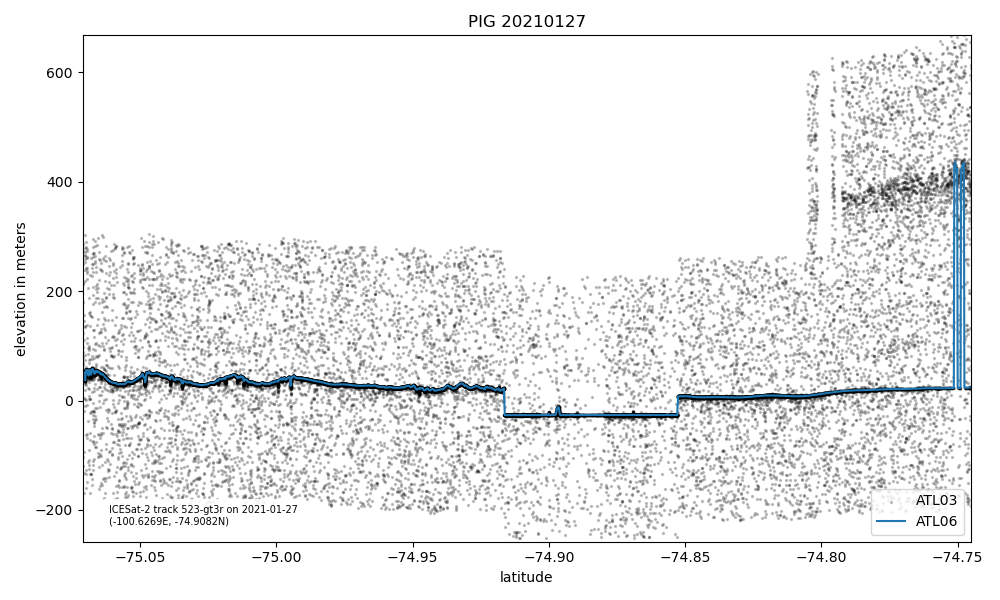

In [5]:
PIG_20210127_fig,PIG_20210127_data=plot_from_oa_url(PIG_20210127_url,PIG_20210127_gtx,title='PIG 20210127',plot_atl07=False,plot_atl08=False)
# plt.xlim(-74.9164,-74.8528)
# plt.ylim(-27,-26)
# plt.title('PIG 20210127',color='red')

In [6]:
# figfile = 'PIG_20210127_fig.png'
# PIG_20210127_fig.savefig(figfile, dpi=300)

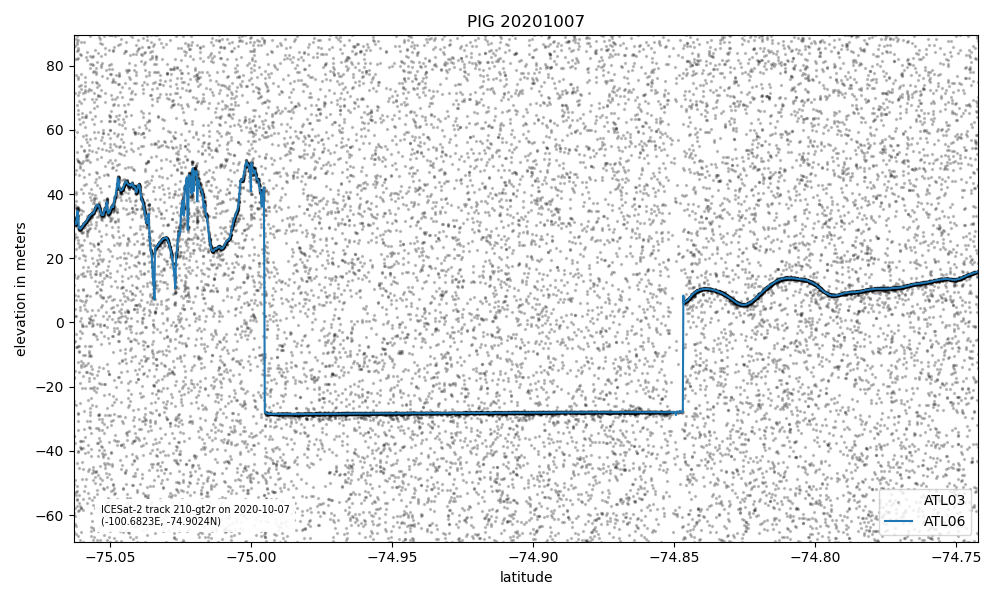

In [7]:
PIG_20201007_fig,PIG_20201007_data=plot_from_oa_url(PIG_20201007_url,PIG_20201007_gtx,title='PIG 20201007',plot_atl07=False,plot_atl08=False)
# plt.xlim(-75.04,-74.8)
# plt.ylim(-40,50)
# plt.title('PIG 20201007',color='orange')

In [8]:
# figfile = 'PIG_20201007_fig.png'
# PIG_20201007_fig.savefig(figfile, dpi=300)

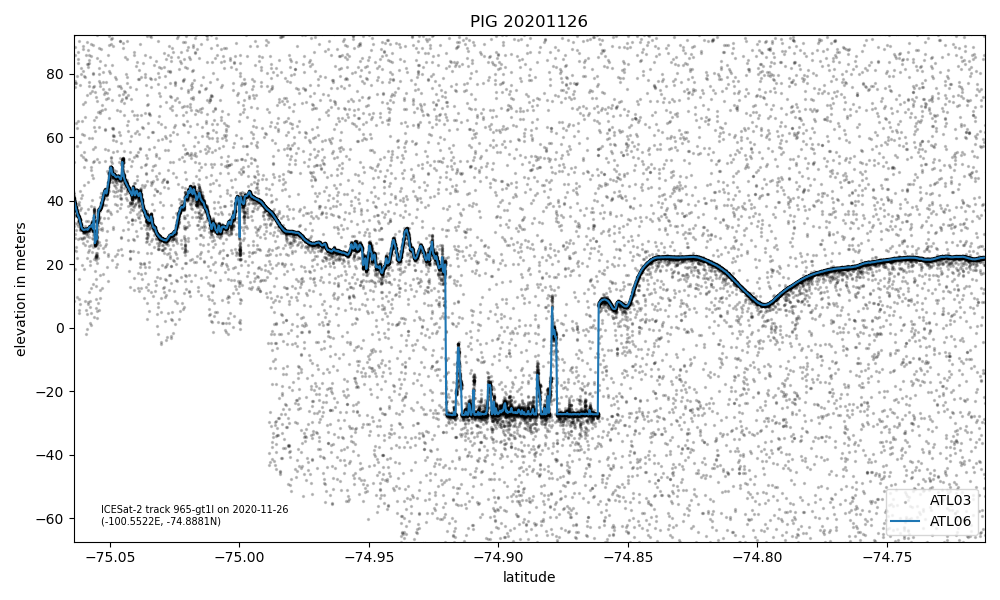

In [9]:
PIG_20201126_fig,PIG_20201126_data=plot_from_oa_url(PIG_20201126_url,PIG_20201126_gtx,title='PIG 20201126',plot_atl07=False,plot_atl08=False)
# plt.title('PIG 20201126',color='magenta')
# plt.xlim(-74.9207,-74.8611)
# plt.ylim(-28,-25)

In [10]:
# figfile = 'PIG_20201126_fig.png'
# PIG_20201126_fig.savefig(figfile, dpi=300)

## Now let's see where this IS-2 track is located

In [11]:
# Initialize geemap
Map = geemap.Map()
Map


Map(center=[20, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Togg…

In [12]:
# Center the map to the area of interest and add Google Maps Satellite as basemap
lat1, lat2 = PIG_20210127_data.atl08.lat[0], PIG_20210127_data.atl08.lat.iloc[-1]
lon1, lon2 = PIG_20210127_data.atl08.lon[0], PIG_20210127_data.atl08.lon.iloc[-1]
center_lon = (lon1 + lon2) / 2
center_lat = (lat1 + lat2) / 2
Map.setCenter(center_lon, center_lat, zoom=8);
Map.add_basemap('SATELLITE')

In [13]:
# Function that creates a Google Earth Engine (GEE) featureCollection with the position of the IS-2 track
def is2_featurecollection(data):
    ground_track_coordinates = list(zip(data.atl06.lon, data.atl06.lat))
    ground_track_projection = 'EPSG:4326' 
    gtx_feature = ee.FeatureCollection(ee.Geometry.LineString(coords=ground_track_coordinates, 
                                      proj=ground_track_projection, 
                                      geodesic=True))
    return gtx_feature


PIG_20210127_feature = is2_featurecollection(PIG_20210127_data)
PIG_20201007_feature = is2_featurecollection(PIG_20201007_data)
PIG_20201126_feature = is2_featurecollection(PIG_20201126_data)
    

In [14]:
# Function to mask out clouds from Sentinel-2
def maskS2clouds(image):
    qa = image.select('QA60')
    # Bits 10 and 11 are clouds and cirrus, respectively.
    cloudBitMask = 1 << 10
    cirrusBitMask = 1 << 11
    
    #Both flags should be set to zero, indicating clear conditions.
    mask = qa.bitwiseAnd(cloudBitMask).eq(0).And(qa.bitwiseAnd(cirrusBitMask).eq(0))
    return image.updateMask(mask).divide(10000)


# Function to get a median Sentinel-2 image within +- 30 days of the time of interest
# If mask_clouds=False the image which is being returned from the function has to be divided by 10000
def getMatchingS2Image(data,center_lon,center_lat,mask_clouds=True):
    s2 = ee.ImageCollection('COPERNICUS/S2_SR')
    POI = ee.Geometry.Point(center_lon, center_lat)
    s2 = s2.filterBounds(POI)
    
    days_buffer_imagery = 30

    dateformat = '%Y-%m-%d'
    datetime_requested = datetime.strptime(data.date, dateformat)
    search_start = (datetime_requested - timedelta(days=days_buffer_imagery)).strftime(dateformat)
    search_end = (datetime_requested + timedelta(days=days_buffer_imagery)).strftime(dateformat)

    s2 = s2.filterDate(search_start, search_end)
    s2 = s2.filterMetadata('CLOUDY_PIXEL_PERCENTAGE','less_than',60)
    if mask_clouds == True:
        s2 = s2.map(maskS2clouds)
    return s2.median()

In [15]:
PIG_20210127_s2Image = getMatchingS2Image(PIG_20210127_data,center_lon,center_lat,mask_clouds=True)
PIG_20201007_s2Image = getMatchingS2Image(PIG_20201007_data,center_lon,center_lat,mask_clouds=True)
PIG_20201126_s2Image = getMatchingS2Image(PIG_20201126_data,center_lon,center_lat,mask_clouds=True)

In [16]:
# Sentinel-2 visualization parameters
s2Vis = {
  'min': 0.4,
  'max': 1,
  'bands': ['B4', 'B3', 'B2'],
};

Map.addLayer(PIG_20210127_s2Image,s2Vis,'PIG_20210127_s2Image')
Map.addLayer(PIG_20201007_s2Image,s2Vis,'PIG_20201007_s2Image')
Map.addLayer(PIG_20201126_s2Image,s2Vis,'PIG_20201126_s2Image')

In [17]:
"""
This part loads the basal melt rates from Shean et al 2019 from my personal GEE account. 
To make this work for other people, you need to upload the basal melt rates as GEE assets to your own account.
"""

# bmr_alongflow = ee.Image('users/azcryosphere/SheanPIG_BMR_along-flow')
# bmr_initialpixel = ee.Image('users/azcryosphere/SheanPIG_BMR_initial-pixel')

# meltVis = {'min':0, 'max': 60, 'palette':['black','darkmagenta','red','orange','yellow','white']}

# Map.addLayer(bmr_alongflow, meltVis,'Shean et al. 2019 - along flow BMR')
# Map.addLayer(bmr_initialpixel, meltVis,'Shean et al. 2019 - initial pixel BMR')

# colors = meltVis['palette']
# vmin = meltVis['min']
# vmax = meltVis['max']

# Map.add_colorbar_branca(colors=colors, vmin=vmin, vmax=vmax, layer_name="Shean et al. 2019 - initial pixel BMR")

'\nThis part loads the basal melt rates from Shean et al 2019 from my personal GEE account. \nTo make this work for other people, you need to upload the basal melt rates as GEE assets to your own account.\n'

In [18]:
Map.addLayer(PIG_20210127_feature,{'color':'red'},'PIG_20210127_feature')
Map.addLayer(PIG_20201007_feature,{'color':'orange'},'PIG_20201007_feature')
Map.addLayer(PIG_20201126_feature,{'color':'magenta'},'PIG_20201126_feature')

## Now we move on to Bach

In [19]:
Bach_20181226_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2018-12-26&minx=-72.93860124512382&miny=-72.31989573957638&maxx=-72.60900185631486&maxy=-72.19542641765992&trackId=1352&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&outputFormat=json'
Bach_20181226_gtx = 'gt3l'

Bach_20191224_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2019-12-24&minx=-72.93860124512382&miny=-72.31989573957638&maxx=-72.60900185631486&maxy=-72.19542641765992&trackId=1352&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&outputFormat=json'
Bach_20191224_gtx = 'gt3l'

Bach_20211220_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2021-12-20&minx=-72.93860124512382&miny=-72.31989573957638&maxx=-72.60900185631486&maxy=-72.19542641765992&trackId=1352&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&outputFormat=json'
Bach_20211220_gtx = 'gt3l'

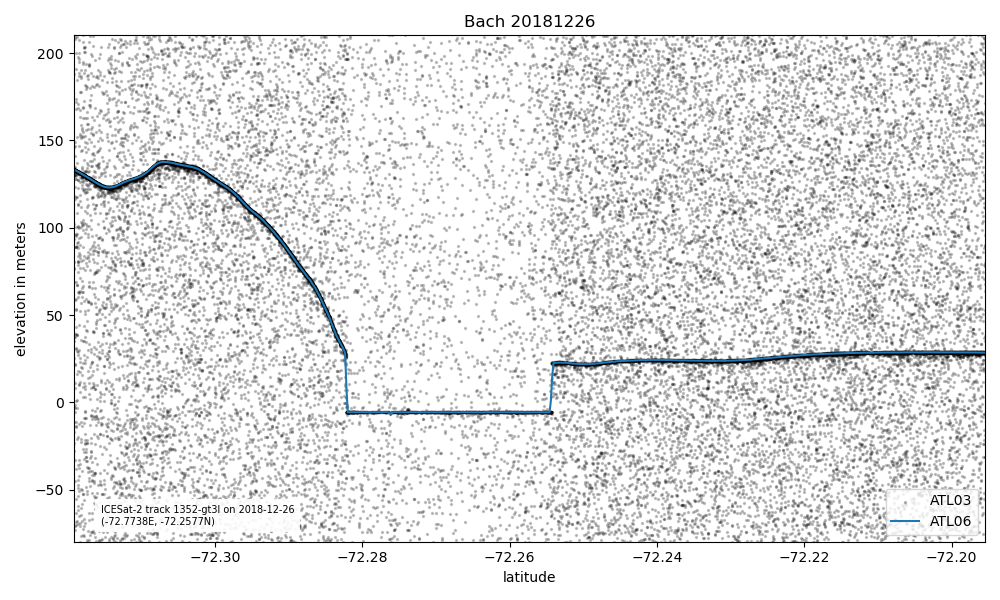

In [20]:
Bach_20181226_fig,Bach_20181226_data=plot_from_oa_url(Bach_20181226_url,Bach_20181226_gtx,title='Bach 20181226',plot_atl07=False,plot_atl08=False)
# plt.xlim(-72.29,-72.24)
# plt.ylim(-10,60)
# plt.title('Bach 20181226',color='red')

In [21]:
# figfile = 'Bach_20181226_fig.png'
# plt.savefig(figfile, dpi=300)

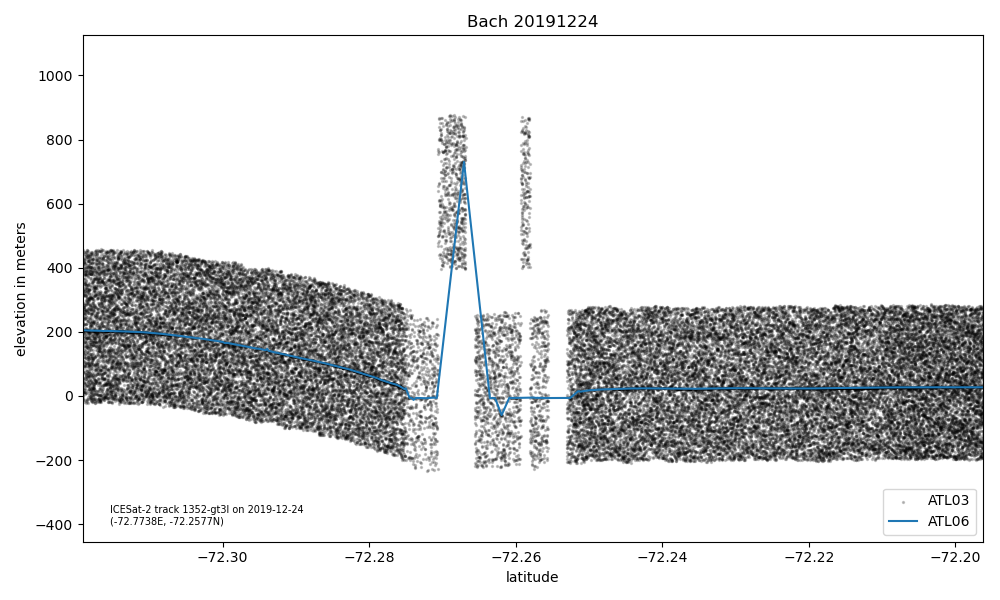

In [22]:
Bach_20191224_fig,Bach_20191224_data=plot_from_oa_url(Bach_20191224_url,Bach_20191224_gtx,title='Bach 20191224',plot_atl07=False,plot_atl08=False)
# plt.xlim(-72.28,-72.245)
# plt.ylim(-60,60)
# plt.title('Bach 20191224',color='orange')

In [23]:
# figfile = 'Bach_20191224_fig.png'
# plt.savefig(figfile, dpi=300)

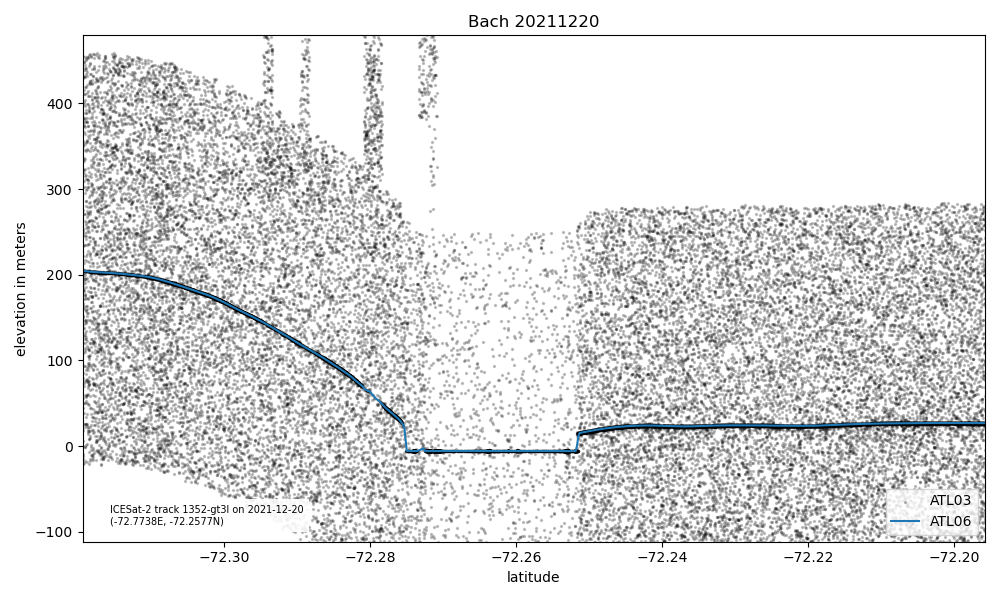

In [24]:
Bach_20211220_fig,Bach_20211220_data=plot_from_oa_url(Bach_20211220_url,Bach_20211220_gtx,title='Bach 20211220',plot_atl07=False,plot_atl08=False)
# plt.xlim(-72.28,-72.245)
# plt.ylim(-30,60)
# plt.title('Bach 20211220',color='magenta')

In [25]:
# figfile = 'Bach_20211220_fig.png'
# plt.savefig(figfile, dpi=300)

In [26]:
MapBach = geemap.Map()
MapBach

Map(center=[20, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Togg…

In [27]:
lat1Bach, lat2Bach = Bach_20181226_data.atl08.lat[0], Bach_20181226_data.atl08.lat.iloc[-1]
lon1Bach, lon2Bach = Bach_20181226_data.atl08.lon[0], Bach_20181226_data.atl08.lon.iloc[-1]
center_lonBach = (lon1Bach + lon2Bach) / 2
center_latBach = (lat1Bach + lat2Bach) / 2
MapBach.setCenter(center_lonBach, center_latBach, zoom=10);
MapBach.add_basemap('SATELLITE')

In [28]:
Bach_20181226_feature = is2_featurecollection(Bach_20181226_data)
Bach_20191224_feature = is2_featurecollection(Bach_20191224_data)
Bach_20211220_feature = is2_featurecollection(Bach_20211220_data)

In [29]:
Bach_20181226_s2Image = getMatchingS2Image(Bach_20181226_data,center_lonBach,center_latBach,mask_clouds=False).divide(10000)
Bach_20191224_s2Image = getMatchingS2Image(Bach_20191224_data,center_lonBach,center_latBach,mask_clouds=False).divide(10000)
Bach_20211220_s2Image = getMatchingS2Image(Bach_20211220_data,center_lonBach,center_latBach,mask_clouds=False).divide(10000)

In [30]:
MapBach.addLayer(Bach_20181226_s2Image,s2Vis,'Bach_20181226_s2Image')
MapBach.addLayer(Bach_20191224_s2Image,s2Vis,'Bach_20191224_s2Image')
MapBach.addLayer(Bach_20211220_s2Image,s2Vis,'Bach_20211220_s2Image')

In [31]:
MapBach.addLayer(Bach_20181226_feature,{'color':'red'},'Bach_20181226_feature')
MapBach.addLayer(Bach_20191224_feature,{'color':'orange'},'Bach_20191224_feature')
MapBach.addLayer(Bach_20211220_feature,{'color':'magenta'},'Bach_20211220_feature')

## Download IS-2 data using icepyx, put into pandas dataframe, and make basic plots
#### Author: Wilson Sauthoff (sauthoff@mines.edu)

In [6]:
# import necessary packages
import icepyx as ipx 
import h5py 
import pandas as pd
import glob
from ipyleaflet import Map, basemaps, basemap_to_tiles, Polyline
import numpy as np
import matplotlib.pyplot as plt
import dask
import cmocean

[['ATL03_20181102195256_05370112_005_01.h5']]
title :  ATLAS/ICESat-2 L2A Global Geolocated Photon Data V005
short_name :  ATL03
version_id :  005
time_start :  2018-10-13T00:00:00.000Z
coordinate_system :  CARTESIAN
summary :  This data set (ATL03) contains height above the WGS 84 ellipsoid (ITRF2014 reference frame), latitude, longitude, and time for all photons downlinked by the Advanced Topographic Laser Altimeter System (ATLAS) instrument on board the Ice, Cloud and land Elevation Satellite-2 (ICESat-2) observatory. The ATL03 product was designed to be a single source for all photon data and ancillary information needed by higher-level ATLAS/ICESat-2 products. As such, it also includes spacecraft and instrument parameters and ancillary data not explicitly required for ATL03.
orbit_parameters :  {'swath_width': '36.0', 'period': '96.8', 'inclination_angle': '92.0', 'number_of_orbits': '0.071428571', 'start_circular_latitude': '0.0'}


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
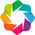

:Overlay
   .WMTS.I :WMTS   [Longitude,Latitude]
   .Path.I :Path   [Longitude,Latitude]

In [7]:
# establish data directory
# path = '/home/jovyan/Polynyas/data/ATL03/Bach/'
#path = '/home/jovyan/Polynyas/data/ATL03/PineIsland/'
#path = '/home/jovyan/Polynyas/data/ATL03/Sulzberger1/'
path = '/tmp/product_comp_ATL03/'

# data product and area of interest parameters
short_name = 'ATL03'

# located three persistent polynyas and some dates of interest
spatial_extent = [-73,-72.4,-72.3,-72.1] # Bach 
# dates when cloud-free scenes of open polynyas are seen in optical MODIS imagery 
# found using https://openaltimetry.org/
date_range = ['2018-11-02','2018-11-02'] 
#date_range = ['2018-12-26','2018-12-26']
#date_range = ['2019-12-24','2019-12-24']
#date_range = ['2021-12-20','2021-12-20']

# spatial_extent = [-101.8,-75.23,-100.50,-74.80] # Pine Island
#date_range = ['2020-10-07','2020-10-07']
#date_range = ['2020-11-26','2020-11-26']
#date_range = ['2021-11-27','2021-11-27']

#spatial_extent = [-151.1,-77,-149.4,-76.7] # Sulzberger1
#date_range = ['2019-01-18','2019-01-18']
#date_range = ['2019-01-18','2019-01-18']
#date_range = ['2019-10-18','2019-10-18']
#date_range = ['2019-11-12','2019-11-12']
#date_range = ['2020-01-13','2020-01-13']
#date_range = ['2020-01-17','2020-01-17']
#date_range = ['2020-11-10','2020-11-10']
#date_range = ['2021-01-10','2021-01-10']
#date_range = ['2021-11-08','2021-11-08']

# query data
region_a = ipx.Query(short_name, spatial_extent, date_range)

#search for available granules and provide basic summary info about them
print(region_a.avail_granules(ids=True))

# see the the properties of the data object we have created
region_a.product_summary_info()
region_a.visualize_spatial_extent()

In [8]:
# establish Earthdata login credentials
earthdata_uid = 'uwhackweek'
email = 'hackweekadmin@gmail.com'
region_a.earthdata_login(earthdata_uid, email)

In [104]:
# authentic user, download files
region_a.earthdata_login(earthdata_uid, email)
region_a.download_granules(path)

Total number of data order requests is  1  for  1  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000002858145
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is: complete
Beginning download of zipped output...
Data request 5000002858145 of  1  order(s) is downloaded.
Download complete


In [9]:
# ensure files downloaded
files=glob.glob(path + '*ATL03*')
files

['/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20211220002332_13521310_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20181102195256_05370112_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20211220131114_13601312_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20191224235228_13600512_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20181226171314_13600112_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20191224110445_13520510_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20181226042532_13520110_005_01.h5']

In [11]:
files_w6beams = []
# filter files to only look at those with have 'heights' key in all their beams
for file in files:
    f = h5py.File(file, 'r')
    if (([key for key in f['gt1l'].keys()].count('heights') > 0) and
     ([key for key in f['gt1r'].keys()].count('heights') > 0) and
     ([key for key in f['gt1r'].keys()].count('heights') > 0) and
     ([key for key in f['gt1r'].keys()].count('heights') > 0) and
     ([key for key in f['gt1r'].keys()].count('heights') > 0) and
     ([key for key in f['gt1r'].keys()].count('heights') > 0)):

        files_w6beams.append(file) 
files_w6beams

['/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20211220002332_13521310_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20181102195256_05370112_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20191224110445_13520510_005_01.h5',
 '/home/jovyan/Polynyas/data/ATL03/Bach/processed_ATL03_20181226042532_13520110_005_01.h5']

In [12]:
# explore signal confidence photon flag
# see data dictionary: https://nsidc.org/sites/nsidc.org/files/technical-references/ICESat2_ATL07_data_dict_v005.pdf and search for 'signal_conf_ph'
f = h5py.File(files[1], 'r')
print([key for key in f.keys()])
print([key for key in f['gt1l'].keys()])
print([key for key in f['gt1l']['heights'].keys()])
dset = f['gt1l']['heights']['signal_conf_ph']
print(dset.shape)
# explore slicing to look at ocean or sea ice 
print(dset[:,1].shape)

['METADATA', 'ancillary_data', 'atlas_impulse_response', 'ds_surf_type', 'ds_xyz', 'gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r', 'orbit_info', 'quality_assessment']
['bckgrd_atlas', 'geolocation', 'geophys_corr', 'heights', 'signal_find_output']
['delta_time', 'dist_ph_across', 'dist_ph_along', 'h_ph', 'lat_ph', 'lon_ph', 'pce_mframe_cnt', 'ph_id_channel', 'ph_id_count', 'ph_id_pulse', 'quality_ph', 'signal_conf_ph']
(801287, 5)
(801287,)


In [16]:
# ATL03, each beam to a pandas dataframe, then concatenate dataframes
with h5py.File(files_w6beams[0], 'r') as f:
    file_name = str(f)
    is2_gt1r = pd.DataFrame(data={'delta_time': f['gt1r/heights/delta_time'][:],
                                  'lat': f['gt1r/heights/lat_ph'][:],
                                  'lon': f['gt1r/heights/lon_ph'][:],
                                  'elev': f['gt1r/heights/h_ph'][:],
                                  'signal_conf_ph_ocean': f['gt1r/heights/signal_conf_ph'][:,1],
                                  'signal_conf_ph_seaice': f['gt1r/heights/signal_conf_ph'][:,2]})
    is2_gt1l = pd.DataFrame(data={'delta_time': f['gt1l/heights/delta_time'][:],
                                  'lat': f['gt1l/heights/lat_ph'][:],
                                  'lon': f['gt1l/heights/lon_ph'][:],
                                  'elev': f['gt1l/heights/h_ph'][:],
                                  'signal_conf_ph_ocean': f['gt1l/heights/signal_conf_ph'][:,1],
                                  'signal_conf_ph_seaice': f['gt1l/heights/signal_conf_ph'][:,2]})
    is2_gt2r = pd.DataFrame(data={'delta_time': f['gt2r/heights/delta_time'][:],
                                  'lat': f['gt2r/heights/lat_ph'][:],
                                  'lon': f['gt2r/heights/lon_ph'][:],
                                  'elev': f['gt2r/heights/h_ph'][:],
                                  'signal_conf_ph_ocean': f['gt2r/heights/signal_conf_ph'][:,1],
                                  'signal_conf_ph_seaice': f['gt2r/heights/signal_conf_ph'][:,2]})
    is2_gt2l = pd.DataFrame(data={'delta_time': f['gt2l/heights/delta_time'][:],
                                  'lat': f['gt2l/heights/lat_ph'][:],
                                  'lon': f['gt2l/heights/lon_ph'][:],
                                  'elev': f['gt2l/heights/h_ph'][:],
                                  'signal_conf_ph_ocean': f['gt2l/heights/signal_conf_ph'][:,1],
                                  'signal_conf_ph_seaice': f['gt2l/heights/signal_conf_ph'][:,2]})
    is2_gt3r = pd.DataFrame(data={'delta_time': f['gt3r/heights/delta_time'][:],
                                  'lat': f['gt3r/heights/lat_ph'][:],
                                  'lon': f['gt3r/heights/lon_ph'][:],
                                  'elev': f['gt3r/heights/h_ph'][:],
                                  'signal_conf_ph_ocean': f['gt3r/heights/signal_conf_ph'][:,1],
                                  'signal_conf_ph_seaice': f['gt3r/heights/signal_conf_ph'][:,2]})
    is2_gt3l = pd.DataFrame(data={'delta_time': f['gt3l/heights/delta_time'][:],
                                  'lat': f['gt3l/heights/lat_ph'][:],
                                  'lon': f['gt3l/heights/lon_ph'][:],
                                  'elev': f['gt3l/heights/h_ph'][:],
                                  'signal_conf_ph_ocean': f['gt3l/heights/signal_conf_ph'][:,1],
                                  'signal_conf_ph_seaice': f['gt3l/heights/signal_conf_ph'][:,2]})

# label beams
is2_gt1r['beam']='is2_gt1r'
is2_gt1l['beam']='is2_gt1l'
is2_gt2r['beam']='is2_gt2r'
is2_gt2l['beam']='is2_gt2l'
is2_gt3r['beam']='is2_gt3r'
is2_gt3l['beam']='is2_gt3l'

# label reference ground tracks (RGT)
is2_gt1r['rgt']=file_name[36:40]
is2_gt1l['rgt']=file_name[36:40]
is2_gt2r['rgt']=file_name[36:40]
is2_gt2l['rgt']=file_name[36:40]
is2_gt3r['rgt']=file_name[36:40]
is2_gt3l['rgt']=file_name[36:40]

# concatenate beams into one dataframe
df = pd.concat([is2_gt1r, is2_gt1l, is2_gt2r, is2_gt2l, is2_gt3r, is2_gt3l])

# subset dataframe to only med and high confidence photons of either ocean or sea ice 
df = df[(df['signal_conf_ph_ocean'] > 3) & (df['signal_conf_ph_seaice'] > 3)]# & (df['quality_ph'] == 0)]
df

# add along track distance, segment ID?

,delta_time,lat,lon,elev,signal_conf_ph_ocean,signal_conf_ph_seaice,beam,rgt
116839,1.251954e+08,-72.163763,-72.465016,26.013744,4,4,is2_gt1r,0023
116840,1.251954e+08,-72.163763,-72.465016,25.870541,4,4,is2_gt1r,0023
116851,1.251954e+08,-72.163769,-72.465019,25.884274,4,4,is2_gt1r,0023
116852,1.251954e+08,-72.163769,-72.465019,25.809401,4,4,is2_gt1r,0023
116868,1.251954e+08,-72.163781,-72.465024,26.057428,4,4,is2_gt1r,0023
...,...,...,...,...,...,...,...,...
625864,1.251954e+08,-72.394384,-72.764441,383.301605,4,4,is2_gt3l,0023
625865,1.251954e+08,-72.394384,-72.764441,383.207214,4,4,is2_gt3l,0023
625866,1.251954e+08,-72.394384,-72.764441,383.266937,4,4,is2_gt3l,0023
625867,1.251954e+08,-72.394384,-72.764441,383.233734,4,4,is2_gt3l,0023


In [17]:
# Set up a map at area of interest, add line of ground tracks
m = Map(
    basemap=basemap_to_tiles(basemaps.Esri.WorldImagery),
    center=(np.mean([spatial_extent[1],spatial_extent[3]]), np.mean([spatial_extent[0],spatial_extent[2]])),
    zoom=8)

gt1r_line = Polyline(
    locations=[
        [df[df['beam']=='is2_gt1r']['lat'].min(), df[df['beam']=='is2_gt1r']['lon'].max()],
        [df[df['beam']=='is2_gt1r']['lat'].max(), df[df['beam']=='is2_gt1r']['lon'].min()]
    ],
    color="green",
    fill=False
)
m.add_layer(gt1r_line)

gt2r_line = Polyline(
    locations=[
        [df[df['beam']=='is2_gt2r']['lat'].min(), df[df['beam']=='is2_gt2r']['lon'].max()],
        [df[df['beam']=='is2_gt2r']['lat'].max(), df[df['beam']=='is2_gt2r']['lon'].min()]
    ],
    color="blue",
    fill=False
)
m.add_layer(gt2r_line)

gt3r_line = Polyline(
    locations=[
        [df[df['beam']=='is2_gt3r']['lat'].min(), df[df['beam']=='is2_gt3r']['lon'].max()],
        [df[df['beam']=='is2_gt3r']['lat'].max(), df[df['beam']=='is2_gt3r']['lon'].min()]
    ],
    color="yellow",
    fill=False
)
m.add_layer(gt3r_line)

m

Map(center=[-72.25, -72.65], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom…

In [18]:
# read in ATL03 6 beams into ond pandas dataframe using Dask
def six_laser_beams(filepaths: list) -> dask.dataframe.DataFrame:
    """
    For all 6 lasers along one reference ground track,
    concatenate all points from all crossing dates into one Dask DataFrame
    """
    lasers: list = ["gt1l", "gt1r", "gt2l", "gt2r", "gt3l", "gt3r"]

    objs: list = [
        xr.open_mfdataset(
            paths=filepaths,
            combine="by_coords",
            engine="h5netcdf",
            group=f"{laser}/heights",
            parallel=True,
        ).assign_coords(coords={"laser": laser})
        for laser in lasers
    ]

    try:
        da: xr.Dataset = xr.concat(objs=objs, dim="laser")
        df: dask.dataframe.DataFrame = da.unify_chunks().to_dask_dataframe()
    except ValueError:
        # ValueError: cannot reindex or align along dimension 'delta_time'
        # because the index has duplicate values
        df: dask.dataframe.DataFrame = dask.dataframe.concat(
            [obj.unify_chunks().to_dask_dataframe() for obj in objs]
        )

    return df

In [21]:
# run six_laser_beams function on one of the files in our filtered list of files_w6beams
g = six_laser_beams(files_w6beams[0])
df_1file = g.compute()

In [22]:
# filter for med/high signal confidence and nominal photon quality
df_1file_filt = df_1file[(df_1file['signal_conf_ph'] > 3) & (df_1file['quality_ph'] == 0)]
df_1file_filt

,delta_time,ds_surf_type,lat_ph,lon_ph,laser,dist_ph_across,dist_ph_along,h_ph,pce_mframe_cnt,ph_id_channel,ph_id_count,ph_id_pulse,quality_ph,signal_conf_ph
45,2021-12-20 00:29:21.733620288,0,-72.100069,-72.434863,gt1l,3409.114746,0.978051,22.435659,3893260499,63,2,178,0,4
48,2021-12-20 00:29:21.733620288,3,-72.100069,-72.434863,gt1l,3409.114746,0.978051,22.435659,3893260499,63,2,178,0,4
55,2021-12-20 00:29:21.733620288,0,-72.100069,-72.434863,gt1l,3409.115723,0.978052,22.308470,3893260499,75,2,178,0,4
58,2021-12-20 00:29:21.733620288,3,-72.100069,-72.434863,gt1l,3409.115723,0.978052,22.308470,3893260499,75,2,178,0,4
60,2021-12-20 00:29:21.733620288,0,-72.100069,-72.434863,gt1l,3409.114502,0.977645,22.498632,3893260499,13,3,178,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1737813,2021-12-20 00:29:25.465820368,3,-72.305607,-72.727107,gt3r,-3410.585205,15.577415,184.298355,3892974605,119,4,160,0,4
1737873,2021-12-20 00:29:25.465920368,3,-72.305614,-72.727110,gt3r,-3410.584717,16.286085,184.159851,3892974605,60,4,161,0,4
1737903,2021-12-20 00:29:25.466020368,3,-72.305620,-72.727113,gt3r,-3410.583984,16.994757,184.048981,3892974605,118,2,162,0,4
1737973,2021-12-20 00:29:25.466120384,3,-72.305626,-72.727116,gt3r,-3410.580078,17.704226,184.377274,3892974605,120,1,163,0,4


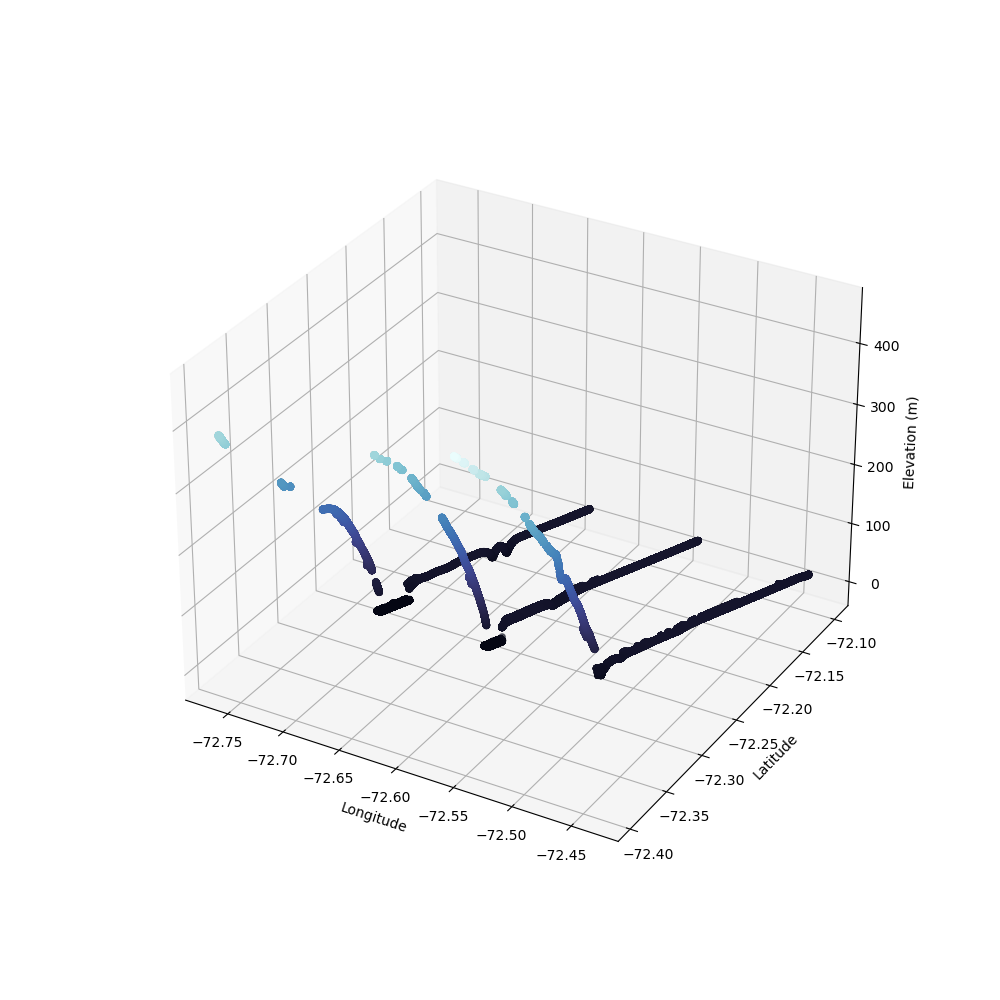

In [27]:
# visualize the data granule
from mpl_toolkits import mplot3d
%matplotlib widget
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.scatter3D(df_1file_filt.lon_ph, df_1file_filt.lat_ph, df_1file_filt.h_ph, c=df_1file_filt.h_ph, cmap=cmocean.cm.ice)
#ax.plot_surface(df_1file_filt.lon_ph, df_1file_filt.lat_ph, df_1file_filt.h_ph, cmap='viridis')
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude'); ax.set_zlabel('Elevation (m)');

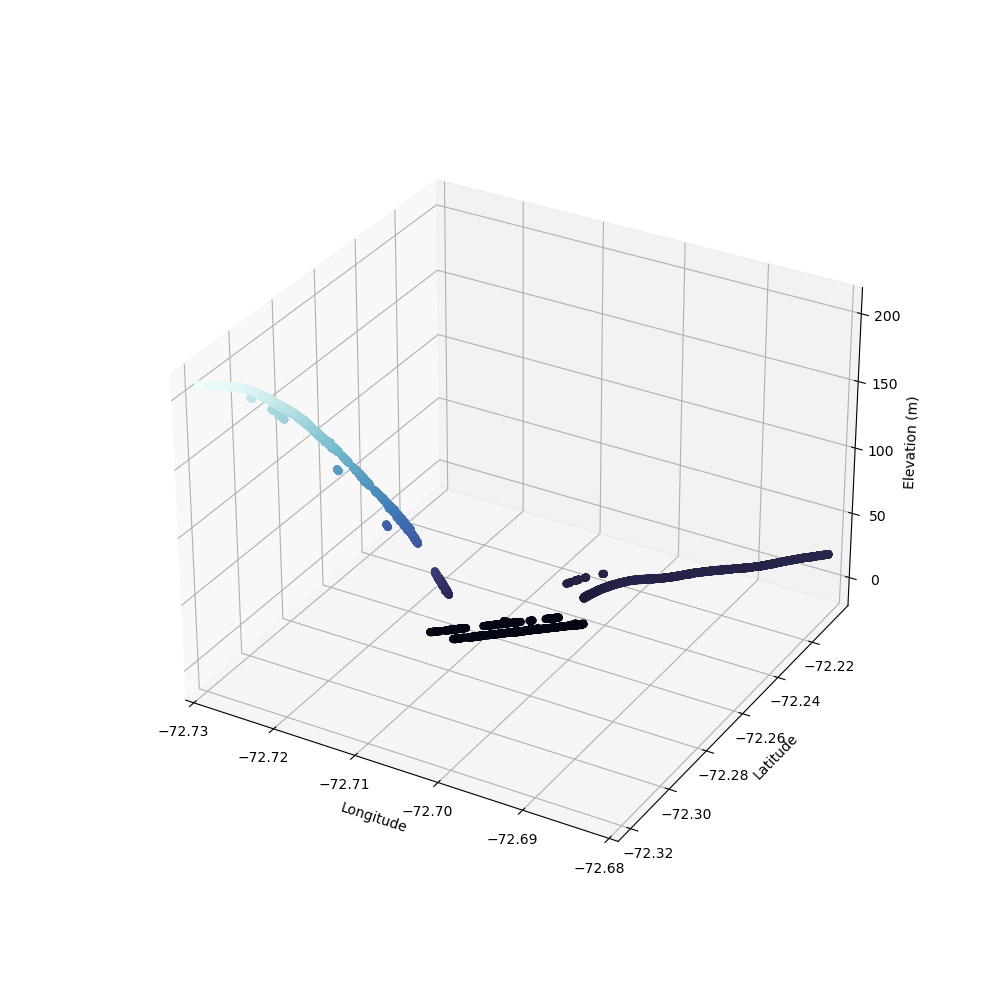

In [28]:
# zoom into one of the beam pairs to view the polynya
from mpl_toolkits import mplot3d
%matplotlib widget
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.scatter3D(df_1file_filt[(df_1file_filt.lon_ph > -72.73) & (df_1file_filt.lon_ph < -72.68) ].lon_ph, 
             df_1file_filt[(df_1file_filt.lon_ph > -72.73) & (df_1file_filt.lon_ph < -72.68) ].lat_ph, 
             df_1file_filt[(df_1file_filt.lon_ph > -72.73) & (df_1file_filt.lon_ph < -72.68) ].h_ph, 
             c=df_1file_filt[(df_1file_filt.lon_ph > -72.73) & (df_1file_filt.lon_ph < -72.68) ].h_ph, cmap=cmocean.cm.ice)
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude'); ax.set_zlabel('Elevation (m)')
ax.set_xlim(-72.73,-72.68);

In [30]:
# apply six_laser_beams function on all the files_w6beams
g = six_laser_beams(files_w6beams)
df_files_w6beams = g.compute()

In [32]:
# filter for med/high signal confidence and nominal photon quality
df_1file_filt = df_files_w6beams[(df_files_w6beams['signal_conf_ph'] > 3) & (df_files_w6beams['quality_ph'] == 0)]
df_1file_filt

,delta_time,ds_surf_type,lat_ph,lon_ph,laser,dist_ph_across,dist_ph_along,h_ph,pce_mframe_cnt,ph_id_channel,ph_id_count,ph_id_pulse,quality_ph,signal_conf_ph
4006455,2018-12-26 04:31:22.811205856,0,-72.100045,-72.483649,gt1l,1749.071899,0.053301,25.195839,403938578,120,2,136,0,4
4006456,2018-12-26 04:31:22.811205856,1,-72.100045,-72.483649,gt1l,1749.071899,0.053301,25.195839,403938578,120,2,136,0,4
4006457,2018-12-26 04:31:22.811205856,2,-72.100045,-72.483649,gt1l,1749.071899,0.053301,25.195839,403938578,120,2,136,0,4
4006458,2018-12-26 04:31:22.811205856,3,-72.100045,-72.483649,gt1l,1749.071899,0.053301,25.195839,403938578,120,2,136,0,4
4006459,2018-12-26 04:31:22.811205856,4,-72.100045,-72.483649,gt1l,1749.071899,0.053301,25.195839,403938578,120,2,136,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15270613,2021-12-20 00:29:25.465820368,3,-72.305607,-72.727107,gt3r,-3410.585205,15.577415,184.298355,3892974605,119,4,160,0,4
15270673,2021-12-20 00:29:25.465920368,3,-72.305614,-72.727110,gt3r,-3410.584717,16.286085,184.159851,3892974605,60,4,161,0,4
15270703,2021-12-20 00:29:25.466020368,3,-72.305620,-72.727113,gt3r,-3410.583984,16.994757,184.048981,3892974605,118,2,162,0,4
15270773,2021-12-20 00:29:25.466120384,3,-72.305626,-72.727116,gt3r,-3410.580078,17.704226,184.377274,3892974605,120,1,163,0,4


## ATL03 to xarray with basic plots
#### Author: Loïc Bachelot ()

In [ ]:
import icepyx as ipx
import numpy as np                   # Numeric Python
import matplotlib.pyplot as plt      # Plotting routines
import h5py                          # general HDF5 reading/writing library
import rioxarray as rx               # Package to read raster data from hdf5 files
from pyproj import Transformer, CRS  # libraries to allow coordinate transforms
import glob                          # Package to locate files on disk
import os                            # File-level utilities
import re                            # regular expressions for string interpretation
import xarray as xr
import dask

In [ ]:
%matplotlib widget 
%config InlineBackend.figure_format = 'retina'

### Construct query

In [ ]:
short_name = 'ATL03'
spatial_extent = [-101.8,-75.23,-100.50,-74.80]
date_range = ['2019-01-01','2019-01-30']

In [ ]:
region_a = ipx.Query(short_name, spatial_extent, date_range)

In [ ]:
print(region_a.product)
print(region_a.dates)
print(region_a.start_time)
print(region_a.end_time)
print(region_a.cycles)
print(region_a.tracks)
print(region_a.product_version)
region_a.visualize_spatial_extent()

In [ ]:
region_a.product_summary_info()
print(region_a.latest_version())

In [ ]:
region_a.CMRparams

In [ ]:
region_a.avail_granules()

In [ ]:
region_a.avail_granules(ids=True)

In [ ]:
region_a.subsetparams()

# Get data

In [ ]:
earthdata_uid = 'loicbachelot'
email = 'loic.bachelot@gmail.com'
region_a.earthdata_login(earthdata_uid, email)

In [ ]:
region_a.order_granules()

In [ ]:
region_a.granules.orderIDs

In [ ]:
path = '/tmp/'
region_a.download_granules(path)

### Read data and plot

Quick look at the data opening one beam data

In [ ]:
! h5ls /tmp/product_comp_ATL03/processed_ATL03_20190115051807_02710210_005_01.h5/gt2r/heights

In [ ]:
ds = xr.open_dataset(
        filename_or_obj="/tmp/processed_ATL03_20190115051807_02710210_005_01.h5",
        group=f"gt2l/heights",# take the middle pair track out of pt1, pt2 & pt3
    )
ds

### Read a full file

In [ ]:
def ATL03_to_xarray(path):
    dataset_list = []
    for track in ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']:
        ds = xr.open_dataset(
            filename_or_obj=path,
            group=f"{track}/heights",
        )
        ds['gt_id'] = [track]
        ds['delta_time'] = np.arange(len(ds.delta_time.data))
        ds = ds.rename({'delta_time': 'id_point'})
        dataset_list.append(ds)
    dataset = xr.concat(dataset_list, dim = 'gt_id')
    return dataset

In [ ]:
ds = ATL03_to_xarray("/tmp/product_comp_ATL03/processed_ATL03_20190115051807_02710210_005_01.h5")
ds

### Selecting one track and simple plotting

In [ ]:
gt2l = ds.sel(gt_id='gt2l')
gt2l = gt2l.where(gt2l.quality_ph == 0, drop=True)
gt2l

In [ ]:
plt.scatter(x=gt2l.lat_ph.data, y=gt2l.h_ph.data)

## Compare ocean surface heights from ICESat-2 and Landsat 8 thermal
#### Author: Mengnan Zhao (mzhao@aer.com) - surface height from ATL03, sea surface height, integration, plotting
#### Author: Tasha Snow (tsnow@mines.edu) - thermal retrieval, photon density and Landsat surface classification, plotting

In [ ]:
import icepyx as ipx
import numpy as np                   # Numeric Python
import matplotlib.pyplot as plt      # Plotting routines
import h5py                          # general HDF5 reading/writing library
import rioxarray as rx               # Package to read raster data from hdf5 files
from pyproj import Transformer, CRS  # libraries to allow coordinate transforms
import glob                          # Package to locate files on disk
import os                            # File-level utilities
import re                            # regular expressions for string interpretation
import xarray as xr
%matplotlib inline
#%matplotlib widget
from tqdm import tqdm
from scipy.stats import norm

In [ ]:
import satsearch
print(satsearch.__version__)
# print(satsearch.config.API_URL)
from satsearch import Search
import geopandas as gpd
import ast
import pandas as pd
import geoviews as gv
import hvplot.pandas
from ipywidgets import interact
from IPython.display import display, Image
import intake # if you've installed intake-STAC, it will automatically import alongside intake
import boto3
import rasterio as rio
import rioxarray as rxr
from rasterio.session import AWSSession
from rasterio.plot import show
from dask.utils import SerializableLock
import hvplot.xarray
from pyproj import Proj, transform
import earthpy.plot as ep
from metpy.interpolate import cross_section

In [ ]:
short_name = 'ATL03'
# PineIsland
spatial_extent = [-101.8,-75.23,-100.50,-74.80]
#date_range = ['2019-01-01','2019-01-30']
date_range = ['2019-04-16','2019-04-16']

In [ ]:
region_a = ipx.Query(short_name, spatial_extent, date_range)

In [ ]:
region_a.avail_granules(ids=True)

In [ ]:
earthdata_uid = 'mengnanzhao'
email = 'mzhao@aer.com'
region_a.earthdata_login(earthdata_uid, email)

In [ ]:
region_a.order_granules()

In [ ]:
region_a.granules.orderIDs

In [ ]:
path = '/tmp/'
region_a.download_granules(path)

### Read a file 

In [162]:
# ds = ATL03_to_xarray("/tmp/processed_ATL03_20190115051807_02710210_005_01.h5")
ds = ATL03_to_xarray("/tmp/processed_ATL03_20190416005803_02710310_005_01.h5")
ds

<xarray.Dataset>
Dimensions:         (id_point: 416516, gt_id: 6, ds_surf_type: 5)
Coordinates:
  * id_point        (id_point) int64 0 1 2 3 4 ... 416512 416513 416514 416515
    lat_ph          (gt_id, id_point) float64 -74.8 -74.8 -74.8 ... nan nan nan
    lon_ph          (gt_id, id_point) float64 -101.3 -101.3 -101.3 ... nan nan
  * gt_id           (gt_id) <U4 'gt1l' 'gt1r' 'gt2l' 'gt2r' 'gt3l' 'gt3r'
Dimensions without coordinates: ds_surf_type
Data variables:
    dist_ph_across  (gt_id, id_point) float32 3.404e+03 3.404e+03 ... nan nan
    dist_ph_along   (gt_id, id_point) float32 0.2311 0.2328 0.2307 ... nan nan
    h_ph            (gt_id, id_point) float32 -27.62 -27.99 -27.56 ... nan nan
    pce_mframe_cnt  (gt_id, id_point) float64 8.831e+08 8.831e+08 ... nan nan
    ph_id_channel   (gt_id, id_point) float64 70.0 7.0 68.0 65.0 ... nan nan nan
    ph_id_count     (gt_id, id_point) float64 1.0 1.0 1.0 1.0 ... nan nan nan
    ph_id_pulse     (gt_id, id_point) float64 20.0 20.0 20.0 ... nan nan nan
    quality_ph      (gt_id, id_point) float64 0.0 0.0 0.0 0.0 ... nan nan nan
    signal_conf_ph  (gt_id, id_point, ds_surf_type) float64 4.0 4.0 ... nan nan
Attributes:
    Description:  Contains arrays of the parameters for each received photon.
    data_rate:    Data are stored at the photon detection rate.

In [170]:
# save to nc
#ds.to_netcdf('PI_20190115.nc')
ds.to_netcdf('PI_20190416.nc')

/tmp/ipykernel_2276/410378106.py:3: SerializationWarning: saving variable pce_mframe_cnt with floating point data as an integer dtype without any _FillValue to use for NaNs
  ds.to_netcdf('PI_20190416.nc')
/tmp/ipykernel_2276/410378106.py:3: SerializationWarning: saving variable ph_id_channel with floating point data as an integer dtype without any _FillValue to use for NaNs
  ds.to_netcdf('PI_20190416.nc')
/tmp/ipykernel_2276/410378106.py:3: SerializationWarning: saving variable ph_id_count with floating point data as an integer dtype without any _FillValue to use for NaNs
  ds.to_netcdf('PI_20190416.nc')
/tmp/ipykernel_2276/410378106.py:3: SerializationWarning: saving variable ph_id_pulse with floating point data as an integer dtype without any _FillValue to use for NaNs
  ds.to_netcdf('PI_20190416.nc')
/tmp/ipykernel_2276/410378106.py:3: SerializationWarning: saving variable quality_ph with floating point data as an integer dtype without any _FillValue to use for NaNs
  ds.to_netcdf

In [3]:
# read nc
ds = xr.open_dataset("PI_20190115.nc")

In [4]:
ds

<xarray.Dataset>
Dimensions:         (id_point: 378909, gt_id: 6, ds_surf_type: 5)
Coordinates:
  * id_point        (id_point) int64 0 1 2 3 4 ... 378905 378906 378907 378908
  * gt_id           (gt_id) object 'gt1l' 'gt1r' 'gt2l' 'gt2r' 'gt3l' 'gt3r'
Dimensions without coordinates: ds_surf_type
Data variables:
    dist_ph_across  (gt_id, id_point) float32 ...
    dist_ph_along   (gt_id, id_point) float32 ...
    h_ph            (gt_id, id_point) float32 ...
    lat_ph          (gt_id, id_point) float64 ...
    lon_ph          (gt_id, id_point) float64 ...
    pce_mframe_cnt  (gt_id, id_point) uint32 ...
    ph_id_channel   (gt_id, id_point) uint8 ...
    ph_id_count     (gt_id, id_point) int8 ...
    ph_id_pulse     (gt_id, id_point) uint8 ...
    quality_ph      (gt_id, id_point) int8 ...
    signal_conf_ph  (gt_id, id_point, ds_surf_type) int8 ...
Attributes:
    Description:  Contains arrays of the parameters for each received photon.
    data_rate:    Data are stored at the photon detection rate.

### Simple plotting

In [ ]:
gt2l = ds.sel(gt_id='gt2l')
gt2l = gt2l.where(gt2l.quality_ph == 0, drop=True)
gt2l

In [ ]:
plt.scatter(x=gt2l.lat_ph.data, y=gt2l.h_ph.data)

### Retrieve ocean surface height from ICESat-2 ATL03

#### Select "ocean" photons

In [171]:
def ocn_sec(ds):
    '''
    This function returns dataset containing ATL03 classified as ocean area (accuracy not well?)
    with confidence level in ocean column larger than 2 (medium and high)
    with quality <2 nominal + possible after pulse)
    '''
    ocn_ds = ds.where( (ds['signal_conf_ph'][:,2]>2) & (ds['quality_ph']<2) , drop=True)
    return ocn_ds

#### Height estimates & photon density

In [6]:
from math import sin, cos, sqrt, atan2, radians
def distance(lon1,lat1,lon2,lat2):
    '''
    This function calculates distance between two coordinates
    return distance in meter
    '''
    # approximate radius of earth in km
    R = 6373.0
    
    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)
    
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    dist = R * c * 1000
    return dist

def ssh_estimate(ocn_ds,num_photon,binsize):
    '''
    This function returns ssh estimates on a running section 
    section length is associated with the number of photons chosen
    returns height estimates based on the histogram, mean latitude/longitude in the chosen photons, and 
    photon density
    '''
    h_value = [];
    h_err = [];
    lon_ave = [];
    lat_ave = [];
    ph_density = [];
    
    for i in range(0,len(ocn_ds['lat_ph']),num_photon):
    #for i in range(0,len(ocn_ds['lat_ph']),10):
        h = ocn_ds['h_ph'][i:i+num_photon]
        # histogram and the representative values
        h_hist = np.histogram(h,bins=np.arange(-100,100,binsize))
        h_value = np.append(h_value, np.mean(h_hist[1][np.where(h_hist[0]==h_hist[0].max())]))
        # std error for uncertainties
        h_err = np.append(h_err, np.std(h)/np.sqrt(num_photon))
        # mean lat/lon
        lats = ocn_ds['lat_ph'][i:i+num_photon]
        lons = ocn_ds['lon_ph'][i:i+num_photon]
        lon_ave = np.append(lon_ave, np.mean(lons))
        lat_ave = np.append(lat_ave, np.mean(lats))
        
        # photon density
        latmax,latmin = lats.max(),lats.min()
        lonmax,lonmin = lons.max(),lons.min() 
        trans_distance = distance(lonmax,latmax,lonmin,latmin)
        ph_density.append(num_photon/trans_distance*100)
        ocean_class = [i<45 for i in ph_density]
        
    # write results into xarray dataset
    ds = xr.Dataset(
        data_vars=dict(
            h_estimate=(["x"], h_value),
            h_err=(["x"], h_err),
            ph_dens=(['x'], ph_density),
            ocean_class=(['x'], ocean_class),
            ),
        coords=dict(
            lon=(["x"], lon_ave),
            lat=(["x"], lat_ave),
            ),
        
        attrs=dict(description="height estimated from histogram"),
        )
    return ds

#### PineIsland, 2019/01/15

In [172]:
ssh_dset_dict = {}
ocn_dset_dict = {}
for track in ['gt1l','gt2l','gt3l','gt1r','gt2r','gt3r']:
    ocn_ds = ocn_sec(ds.sel(gt_id=track))
    ssh = ssh_estimate(ocn_ds,50,0.02)
    ssh_dset_dict[track] = ssh
    ocn_dset_dict[track] = ocn_ds

In [173]:
ocn_dset_dict

{'gt1l': <xarray.Dataset>
 Dimensions:         (id_point: 365591, ds_surf_type: 5)
 Coordinates:
   * id_point        (id_point) int64 0 2 3 4 5 ... 400143 400144 400145 400146
     lat_ph          (id_point) float64 -74.8 -74.8 -74.8 ... -75.23 -75.23
     lon_ph          (id_point) float64 -101.3 -101.3 -101.3 ... -101.5 -101.5
     gt_id           <U4 'gt1l'
 Dimensions without coordinates: ds_surf_type
 Data variables:
     dist_ph_across  (id_point) float32 3.404e+03 3.404e+03 ... 3.406e+03
     dist_ph_along   (id_point) float32 0.2311 0.2307 0.2311 ... 19.36 19.36
     h_ph            (id_point) float32 -27.62 -27.56 -27.64 ... 33.86 33.86
     pce_mframe_cnt  (id_point) float64 8.831e+08 8.831e+08 ... 8.831e+08
     ph_id_channel   (id_point) float64 70.0 68.0 65.0 1.0 ... 64.0 9.0 2.0 68.0
     ph_id_count     (id_point) float64 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
     ph_id_pulse     (id_point) float64 20.0 20.0 20.0 20.0 ... 134.0 134.0 134.0
     quality_ph      (id_poi

#### Figure: histogram over an ocean area

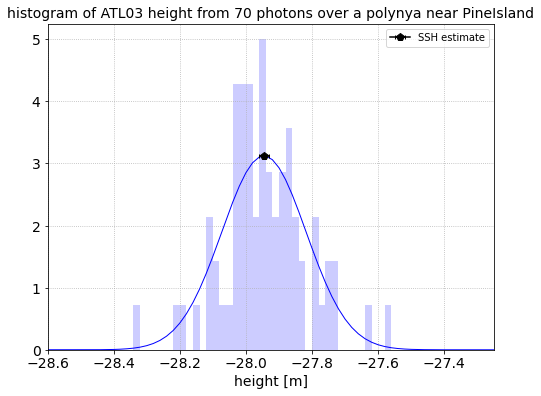

In [127]:
# histogram over an ocean area looks like:
i = 2000; num_photon=70; track = 'gt2l';
h = ocn_dset_dict[track]['h_ph'][i:i+num_photon]
# Fit a normal distribution to the data:
# mean and standard deviation
mu, std = norm.fit(h) 
# Plot the PDF.
x = np.arange(-30, -26, 0.02)
p = norm.pdf(x, mu, std)

fig, ax = plt.subplots(figsize=(8,6))
ax.tick_params(labelsize=14)
ax.plot(x, p, 'b', linewidth=1)
ax.errorbar(mu, p[np.where(x>=mu)[0].min()], xerr=ssh['h_err'][int(np.floor(i/70))], marker='p', markersize=8, capsize=2,color='k',label='SSH estimate')
# histogram and the representative values
h_hist = plt.hist(h,bins=np.arange(-30,-26,0.02),density=True, alpha=0.2, color='b',rwidth=3)
plt.xlim(-28.6,-27.25)
plt.grid(linestyle=':')
plt.xlabel('height [m]',fontsize=14)
plt.title('histogram of ATL03 height from 70 photons over a polynya near PineIsland',fontsize=14)
plt.legend()

#### Height along one beam and photon class

In [174]:
ssh = ssh_dset_dict['gt2l']
ssh

<xarray.Dataset>
Dimensions:      (x: 6008)
Coordinates:
    lon          (x) float64 -101.4 -101.4 -101.4 ... -101.6 -101.6 -101.6
    lat          (x) float64 -74.8 -74.8 -74.8 -74.8 ... -75.23 -75.23 -75.23
Dimensions without coordinates: x
Data variables:
    h_estimate   (x) float64 -27.8 -27.66 -27.75 -27.8 ... 45.1 45.06 45.05
    h_err        (x) float64 0.02265 0.01953 0.01918 ... 0.1168 0.01909 0.01828
    ph_dens      (x) float64 546.5 593.3 590.0 ... 1.19e+03 1.02e+03 3.736e+06
    ocean_class  (x) bool False False False False ... False False False False
Attributes:
    description:  height estimated from histogram

Plot photon density and ocean/ice class

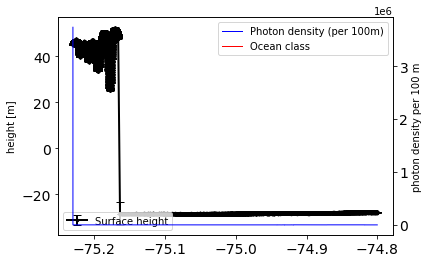

In [177]:
ocean = ssh['ph_dens'].where(ssh['ocean_class']==1,np.nan)

fig, ax1 = plt.subplots()

ax1.tick_params(labelsize=14)
ax1.errorbar(ssh['lat'], ssh['h_estimate'], yerr=ssh['h_err'], marker='.', color='k',markersize=5, capsize=4,linewidth=2,label='Surface height')
#ax1.set_xlim(-75.25,-74.8)
ax1.set_ylabel('height [m]')

ax2 = ax1.twinx() 
ax2.tick_params(labelsize=14)
ax2.plot(ssh['lat'], ssh['ph_dens'],color='b',linewidth=1,label='Photon density (per 100m)')
ax2.plot(ssh['lat'], ocean,color='r',linewidth=1,label='Ocean class')
ax2.set_ylim(-10,200)
ax2.set_ylabel('photon density per 100 m')

ax1.legend(loc='lower left')
ax2.legend()

plt.show()

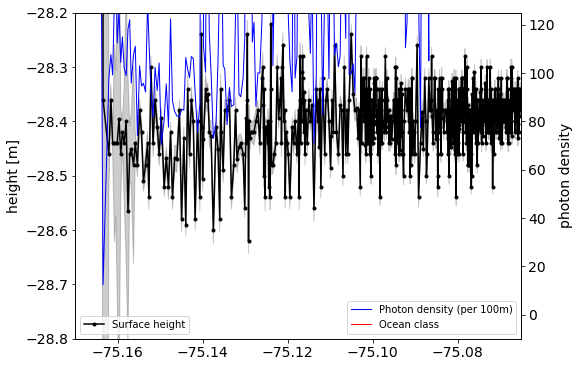

In [176]:
fig, ax1 = plt.subplots(figsize=(8,6))

ax1.tick_params(labelsize=14)
#ax1.errorbar(ssh['lat'], ssh['h_estimate'], yerr=ssh['h_err'], marker='.', color='k',markersize=5, capsize=4,linewidth=2,label='Surface height')
ax1.fill_between(ssh['lat'], ssh['h_estimate']-ssh['h_err'], ssh['h_estimate']+ssh['h_err'],color='k',alpha=0.2)
ax1.plot(ssh['lat'], ssh['h_estimate'],'o-',markersize=3,color='k', label='Surface height')
ax1.set_xlim(-75.17,-75.065)
ax1.set_ylim(-28.8,-28.2)
ax1.set_ylabel('height [m]',fontsize=14)

ax2 = ax1.twinx() 
ax2.tick_params(labelsize=14)
ax2.plot(ssh['lat'], ssh['ph_dens'],color='b',linewidth=1,label='Photon density (per 100m)')
ax2.plot(ssh['lat'], ocean,color='r',linewidth=1,label='Ocean class')
ax2.set_ylim(-10,125)
ax2.set_ylabel('photon density', fontsize=14)

ax1.legend(loc='lower left')
ax2.legend(loc='lower right')

plt.show()
fig.savefig("ssh_ph_dens.png", dpi=300)

#### Height along all 3 beams

In [31]:
from mpl_toolkits import mplot3d

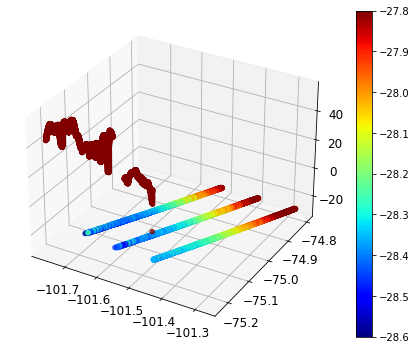

In [178]:
fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection='3d')
for track in ['gt1l','gt2l','gt3l','gt1r','gt2r','gt3r']:
    ssh = ssh_dset_dict[track]
    ocean = ssh['ph_dens'].where(ssh['ocean_class']==1,np.nan)

    ax.tick_params(labelsize=12)
    im = ax.scatter3D(ssh['lon'], ssh['lat'],ssh['h_estimate'],c=ssh['h_estimate'],
                 vmin=-28.6,vmax=-27.8,cmap='jet')
    #ax.set_xlim(-75.17,-74.065)
    #ax.set_ylim(-75.17,-75)
    #ax.set_zlabel('height',fontsize=14)
fig.colorbar(im)    
plt.show()

#fig.savefig("ssh_scatter3d.png", dpi=300)

### Acquire Landsat COGs and read into xarray
#### Install required packages

In [60]:
pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 10.2 MB/s eta 0:00:0000:010:01
Note: you may need to restart the kernel to use updated packages.


In [61]:
pip install metpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.6/367.6 KB 4.4 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 KB 1.2 MB/s eta 0:00:00ta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.8/209.8 KB 4.2 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


#### Search for Landsat imagery

Set required credentials to retrieve imagery from a requester pays AWS S3 bucket

In [64]:
# Sets up credentials for acquiring images through dask/xarray
os.environ["AWS_REQUEST_PAYER"] = "requester"

# Sets up proper credentials for acquiring data through rasterio
aws_session = AWSSession(boto3.Session(), requester_pays=True)

Search for imagery in STAC catalog using satsearch

In [181]:
# Search for Landsat or Sentinel images based on a bounding box, date and other metadata if desired
# Save to geojson file
# NOTE this STAC API endpoint does not currently search the entire catalog

satellite = 'Landsat8'

bbox = (-105.0, -74.970, -105.08, -74.950) #(west, south, east, north) 

#timeRange = '2019-01-14/2019-01-15'
timeRange = '2019-04-15/2019-04-16'

if satellite=='Landsat8':
    # url = 'https://ibhoyw8md9.execute-api.us-west-2.amazonaws.com/prod'
    url = 'https://landsatlook.usgs.gov/stac-server'
    collection = 'usgs-landsat/collection02/'
    band = 'blue'
    colnm = ['landsat:wrs_path','landsat:wrs_row']
    end = '_T2' # end of file name if don't want all
    qa_band = 'qa_pixel'
elif satellite=='Sentinel2':
    url = 'https://earth-search.aws.element84.com/v0' # maybe also https://services.sentinel-hub.com/api/v1/catalog/
    collection = 'sentinel-s2-l2a-cogs'
    band = 'B02'
    colnm = ['sentinel:latitude_band','sentinel:grid_square']
    end = 'L2A'
    qa_band = 'SCL'
elif satellite=='Sentinel1': ### Doesn't work
    url = 'http://eocloud.sentinel-hub.com/search'
    collection = 'sentinel-s1-rtc-indigo'
    
results = Search.search(url=url,
                        collection=collection,
                        datetime=timeRange,
                        bbox=bbox,    
                        # properties=properties,
                        sort=['<datetime'])

print('%s items' % results.found())
items = results.items()
gjson_outfile = f'/home/jovyan/Polynyas/contributors/Tasha/{satellite}.geojson'
items.save(gjson_outfile)

2 items


In [182]:
# Load the geojson file
gf = gpd.read_file(gjson_outfile)
gf.head()

,id,datetime,view:sun_azimuth,view:sun_elevation,platform,view:off_nadir,landsat:cloud_cover_land,landsat:wrs_type,landsat:wrs_path,landsat:wrs_row,landsat:scene_id,landsat:collection_category,landsat:collection_number,landsat:correction,proj:epsg,created,updated,geometry
0,LC08_L1GT_005113_20190416_20200828_02_T2,2019-04-16T15:16:00.709964+00:00,57.130110,-1.99005,LANDSAT_8,0,-1,2,005,113,LC80051132019106LGN00,T2,02,L1GT,3031,2021-07-24T03:36:21.180000+00:00,2021-07-24T03:36:21.180000+00:00,"POLYGON ((-103.11326 -74.41189, -108.42380 -73..."
1,LC08_L1GT_158131_20190416_20200829_02_T2,2019-04-16T07:08:48.041206+00:00,175.127037,-25.29310,LANDSAT_8,0,-1,2,158,131,LC81581312019106LGN00,T2,02,L1GT,3031,2021-07-24T04:04:27.556000+00:00,2021-07-24T04:04:27.556000+00:00,"POLYGON ((-98.13703 -74.90951, -101.88807 -73...."


In [183]:
# Plot search area of interest and frames on a map using Holoviz Libraries (more on these later)
cols = gf.loc[:,('id','landsat:wrs_path','landsat:wrs_row','geometry')]
footprints = cols.hvplot(geo=True, line_color='k', hover_cols=['landsat:wrs_path','landsat:wrs_row'], alpha=0.2, title='Landsat 8 T1',tiles='ESRI')
tiles = gv.tile_sources.CartoEco.options(width=700, height=500) 
labels = gv.tile_sources.StamenLabels.options(level='annotation')
tiles * footprints * labels

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Tiles.I    :Tiles   [x,y]
   .Polygons.I :Polygons   [Longitude,Latitude]   (landsat:wrs_path,landsat:wrs_row)
   .WMTS.II    :WMTS   [Longitude,Latitude]

#### Intake all scenes using the intake-STAC library

In [184]:
catalog = intake.open_stac_item_collection(items)
sceneids = list(catalog)
list(catalog)

['LC08_L1GT_005113_20190416_20200828_02_T2',
 'LC08_L1GT_158131_20190416_20200829_02_T2']

#### Open and visualize each image using RasterIO 

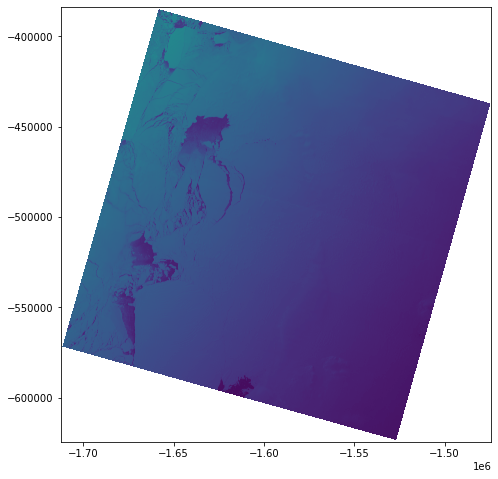

In [190]:
#item0 = catalog[sceneids[3]]
item0 = catalog[sceneids[0]]

# Retrieve first scene using rio
item_url = item0.blue.metadata['alternate']['s3']['href']

# Read and plot with grid coordinates 
with rio.Env(aws_session):
    with rio.open(item_url) as src:
        fig, ax = plt.subplots(figsize=(9,8))
        
        # To plot
        show(src,1)
        
        # To open data into a numpy array
        profile = src.profile
        arr = src.read(1)

#### Read into Xarray

In [70]:
def retrieve_bands(item,satellite):
    '''Get band names for specific satellite
    input:
        item = stac catalog item
        satellite = str satellite name
    return:
        band_names = list of str of desired band names
    '''
    
    band_names = []
    if satellite=='Landsat8':
        for k in item.keys():
            M = getattr(item, k).metadata
            if 'eo:bands' in M:
                resol = M['eo:bands'][0]['gsd']
#                 print(k, resol)
                if resol >= 30: # thermal bands are up sampled from 100 to 30
                    band_names.append(k)
        
    elif satellite=='Sentinel2': # no thermal data so therm will be empty
        for k in item.keys():
            try:
                M = getattr(item, k).metadata
                if 'data' in M['roles']:
                    if 'eo:bands' in M:
                        resol = M['gsd']
                        # print(k, resol)
                        if resol == 10:
                            band_names.append(k)
            except:
                continue
                
    return band_names

def add_mask(qa_band,satellite):
    ''' Add the qa band for the satellite as a mask
    
    input:
        qa_band = str name of satellite qa band
        satellite = str name of satellite
    
    return: 
        mask_c = mask array or qa band
    '''
    
    if satellite == 'Landsat8':
        # Create and add cloud mask (this mask is technically everything except nan,ocean,ice clear sky)
        # 1 is no data, 21952 is ocean, 30048 is ice (can change this to add more)
        # Access mask via 'ts_scenes.isel(time=0).mask'
        
        # Determined qa_pixel values
        ice = [30048, 30304]
        ocean = [21952, 22208]
        cloud = [21762,22018,22280,23826,24082,29986,30242,54790,55052,56598,56660,56854,56916,62758,62820,63014,63076]
        nans = [1]
        
        qa = scene.sel(band=qa_band)
        cond = np.logical_or((qa.isin(ocean))|(qa.isin(ice)), qa==1)
#         cond = np.logical_or((qa==21952)|(qa==30048), qa==1)
        qa_c = qa.where(~cond, np.nan)
        cond = np.logical_or((qa_c.isin(ocean))|(qa_c.isin(ice)), qa_c==1)
        mask_c = qa_c.where(qa_c.isnull(),2) # cloud = 2
        
        # For optional ice mask
        qa_io = qa.where(qa.isin(ice), np.nan)
        mask_io = qa_io.where(~(qa_io.isin(ice)),1) # ice = 1
        mask_c = mask_io.where(mask_io==1,mask_c)
    
    elif satellite == 'Sentinel2':
        mask_c = scene.sel(band=qa_band)
    
    return mask_c

In [191]:
# Import to xarray with cloud mask  ***Creating cloud mask is slow
# nans are in locations where concat of multiple scenes has expanded the grid
# Would like to use SR for all bands except TIR, but they are not available for many scenes so would
# need a separate model for scenes with SR and those without.
scenes = []

# Create time variable for time dim
time_var = xr.Variable('time',gf.loc[gf.id.isin([item for item in sceneids if item.endswith(end)])]['datetime'])
_, index = np.unique(time_var, return_index=True) # for some reason there are duplicates in Sentinel
time_var = time_var[index]
    
for item in sceneids:
    if item.endswith(end):
        item = catalog[item]
        print (item.name)
        
        bands = []
        
        # Get desired band names, currently hard coded for resolutions
        # band_names = retrieve_bands(item,satellite)
        band_names = ['blue','green','red','lwir11']
                    
        # Add qa band
        band_names.append(qa_band)

        # Concatenate desired bands and construct xarray for scene
        for band_name in band_names:
            if satellite=='Landsat8':
                url = item[band_name].metadata['alternate']['s3']['href']
            elif satellite=='Sentinel2':
                url = item[band_name].metadata['href']
            band = item[band_name](chunks=dict(band=1, x=2048, y=2048),urlpath=url).to_dask() # Specify chunk size, landsat is prob in 512 chunks so used multiple
            band['band'] = [band_name]
            bands.append(band)
        scene = xr.concat(bands, dim='band')
        
        # Add qa band or mask and concatenate, in L8 cloud=2/ice=1
        mask = add_mask(qa_band,satellite)
        scene.coords['mask'] = (('y', 'x'), mask.data)
        scenes.append(scene)

# Concatenate scenes with time variable ***This is the slowest
ts_scenes = xr.concat(scenes, dim=time_var)

# Get epsg for Landsat images
# epsg = item.metadata['proj:epsg']
# epsg = ts_scenes.crs
pix = ts_scenes.transform[0]

ts_scenes

LC08_L1GT_005113_20190416_20200828_02_T2
LC08_L1GT_158131_20190416_20200829_02_T2


/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/indexing.py:1234: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  value = value[(slice(None),) * axis + (subkey,)]


,Array,Chunk
Bytes,9.53 GiB,32.00 MiB
Shape,"(2, 5, 13081, 9781)","(1, 1, 2048, 2048)"
Count,3836 Tasks,640 Chunks
Type,float64,numpy.ndarray


#### Subset one image 

In [198]:
sbands = ['blue','green','red','lwir11']

# Select the first datetime
#t = ts_scenes.time.values[2]
t = ts_scenes.time.values[1]
print (t)

# Upper left and lower right coordinates for subsetting to Jakobshavn area
ulx = -1635000
uly = -290000
lrx = -1580000
lry = -350000

timage = ts_scenes.sel(time=t,band='lwir11',y=slice(lry,uly),x=slice(ulx,lrx))
bimage = ts_scenes.sel(time=t,band='blue',y=slice(lry,uly),x=slice(ulx,lrx))
# image = image.rio.reproject(4326) ##doesn't work

pol_y = timage.y
pol_x = timage.x
pol_x, pol_y = np.meshgrid(pol_x, pol_y)

inProj = Proj(init='epsg:3031')
outProj = Proj(init='epsg:4326')
pol_lon,pol_lat = transform(inProj,outProj,pol_x,pol_y) # This order from the landsat coordinates to lat lon

timagen = np.array(timage.where(timage.notnull(),0))
# image = np.moveaxis(image, 0, -1)

2019-04-16T15:16:00.709964+00:00


/srv/conda/envs/notebook/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/srv/conda/envs/notebook/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/tmp/ipykernel_2276/265961219.py:24: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  pol_lon,pol_lat = 

In [42]:
# Visualize with rasterIO
rgb = tscene.sel(band=['red','green','blue']).to_numpy()
rgb = np.moveaxis(rgb, 0, -1)

# Read and plot with grid coordinates 
with rio.Env(aws_session):
    with rio.open(item_url) as src:
        fig, ax = plt.subplots(figsize=(9,8))
        
        # To plot
        show(src,1)

### Extract surface classifications and thermal data from Landsat along an ICESat-2 track

#### Extract transects along IS2 tracks

In [2]:
def getclosest_ij(lons,lats,lonpt,latpt):
    '''
    Determine pixel index of the closest grid cell to a desired point.
    
    Input:
    lons/lats: 2D array of lons/lats
    lonpt/latpt: lon/lat of point to find an index for closest grid cell
    Return:
    x/y: index of lon/lat
    '''
    
    abslat=np.abs(lats-latpt)
    abslon=np.abs(lons-lonpt)
    c = np.maximum(abslon,abslat)
    x, y = np.where(c == np.min(c))
    return x,y

def extract_line(data,lons,lats,lonpt,latpt):
    '''
    Extract a line of pixels between the max and min of another set of lat/lon data
    '''
    
    max_idx = getclosest_ij(lons,lats,lonpt.max().values,latpt.max().values)
    min_idx = getclosest_ij(lons,lats,lonpt.min().values,latpt.min().values)
    x0, y0 = min_idx # These are in _pixel_ coordinates!!
    x1, y1 = max_idx
    num = max(np.abs(x1-x0)[0],np.abs(y1-y0)[0])
    x, y = np.linspace(x0, x1, num), np.linspace(y0, y1, num)

    # Extract the values along the line
    data_transect = data[x.astype(np.int), y.astype(np.int)]
    return data_transect

In [194]:
# ICESat-2 xarray for one track
dataset = ocn_dset_dict['gt2l']

In [3]:
# Extract transect of data for thermal, a mask of classifications, and lats/lons for plotting
t_transect = extract_line(timagen,pol_lon,pol_lat,dataset.lon_ph,dataset.lat_ph)
mask_transect = extract_line(timage.mask.values,pol_lon,pol_lat,dataset.lon_ph,dataset.lat_ph)
lat_transect = extract_line(pol_lat,pol_lon,pol_lat,dataset.lon_ph,dataset.lat_ph)
lon_transect = extract_line(pol_lon,pol_lon,pol_lat,dataset.lon_ph,dataset.lat_ph)

NameError: name 'timagen' is not defined

#### Plot Landsat visible and thermal images with surface classifications (ice/ocean) and thermal from IS2 transect

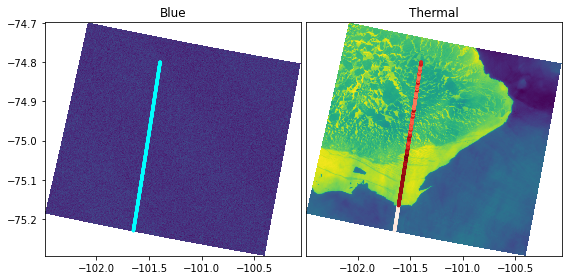

In [200]:
fig, (ax,ax1) = plt.subplots(ncols=2,sharey=True,sharex=True,figsize=(8,4))
ax.pcolormesh(pol_lon,pol_lat,bimage)
ax.plot(dataset['lon_ph'],dataset['lat_ph'],color='r',linewidth=1)
data = ax.scatter(lon_transect,lat_transect,c=mask_transect,s=5,cmap='cool',zorder=2)
# fig.colorbar(data, ax=ax)

ax.title.set_text('Blue')
ax1.pcolormesh(pol_lon,pol_lat,timagen)
data = ax1.scatter(lon_transect,lat_transect,c=t_transect,s=5,cmap='Reds',zorder=2)
ax1.title.set_text('Thermal')
ax1.axes.get_yaxis().set_visible(False)
# fig.colorbar(data, ax=ax1)

plt.tight_layout(w_pad=0.2)

#### Plot IS2 heights over Landsat thermal

In [76]:
ssh

<xarray.Dataset>
Dimensions:      (x: 121)
Coordinates:
    lon          (x) float64 -101.5 -101.5 -101.5 ... -101.7 -101.7 -101.7
    lat          (x) float64 -74.82 -74.82 -74.82 ... -75.17 -75.17 -75.17
Dimensions without coordinates: x
Data variables:
    h_estimate   (x) float64 -27.94 -28.1 -28.08 -27.98 ... 53.75 53.5 51.81
    h_err        (x) float64 0.04253 0.01673 0.02001 ... 0.02753 0.09575 0.02232
    ph_dens      (x) float64 21.99 229.4 15.45 12.73 ... 12.7 14.68 17.37 309.0
    ocean_class  (x) bool True False True True False ... True True True False
Attributes:
    description:  height estimated from histogram

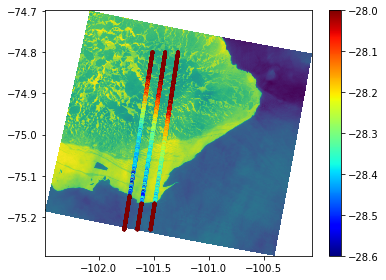

In [202]:
fig, ax = plt.subplots(ncols=1,sharey=True,sharex=True,figsize=(5.5,4))
#ax.pcolormesh(pol_lon,pol_lat,bimage)
ax.pcolormesh(pol_lon,pol_lat,timagen)

for track in ['gt1l','gt2l','gt3l','gt1r','gt2r','gt3r']:
    ssh = ssh_dset_dict[track]
       
    im = ax.scatter(ssh['lon'],ssh['lat'],c=ssh['h_estimate'],s=5,cmap='jet',vmin=-28.6,vmax=-28)

fig.colorbar(im, ax=ax)
plt.tight_layout(w_pad=0.2)

### Comparison of thermal transect vs ssh estimate

In [223]:
ssh['h_estimate']

<xarray.DataArray 'h_estimate' (x: 6008)>
array([-27.8 , -27.66, -27.75, ...,  45.1 ,  45.06,  45.05])
Coordinates:
    lon      (x) float64 -101.4 -101.4 -101.4 -101.4 ... -101.6 -101.6 -101.6
    lat      (x) float64 -74.8 -74.8 -74.8 -74.8 ... -75.23 -75.23 -75.23 -75.23
Dimensions without coordinates: x

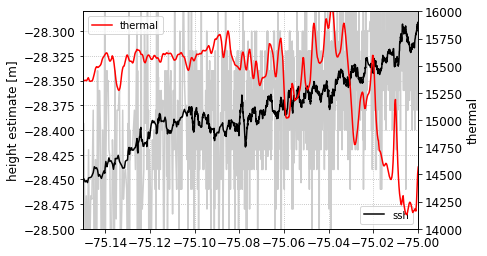

In [241]:
fig, ax = plt.subplots(ncols=1,sharey=True,sharex=True,figsize=(6,4))
ax.pcolormesh(pol_lon,pol_lat,bimage)

for track in ['gt2l']:
    ssh = ssh_dset_dict[track]
    ocean = ssh['h_estimate'].where(ssh['ocean_class']==1,np.nan)
    
    ax.tick_params(labelsize=12)
    ax.plot(ssh['lat'],ssh['h_estimate'],color=[.8, .8, .8])
    #ax.plot(ssh['lat'],ocean,color='k',label='ssh')
    # running mean?
    ssh_run = ssh['h_estimate'].rolling(x=30, center=True).mean()
    ax.plot(ssh['lat'],ssh_run,color='k',label='ssh')
ax.set_ylabel('height estimate [m]',fontsize=12)
ax.legend()
#plt.xlim(-75.17,-75.09);
plt.xlim(-75.15,-75);
#plt.ylim(-28.6,-28.33);
plt.ylim(-28.5,-28.28);
plt.grid(linestyle=':')   

ax1 = ax.twinx()
ax1.tick_params(labelsize=12)
ax1.plot(lat_transect,t_transect,color='r',label='thermal')
ax1.set_ylabel('thermal',fontsize=12)
#plt.ylim(17100,17450);
plt.ylim(14000,16000);
ax1.legend()

plt.show()

## Process polynya surface data in SlideRule
#### Author: Tasha Snow (tsnow@mines.edu)
__From code by Tyler Sutterley__

#### Initiate SlideRule API
- Sets the URL for accessing the SlideRule service
- Builds a table of servers available for processing data

In [2]:
# set the url for the sliderule service
# set the logging level
sliderule.icesat2.init("icesat2sliderule.org", loglevel=logging.WARNING)

#### Set options for making science data processing requests to SlideRule

In [43]:
# Set parameters
params= {'srt': 1,
 'len': 20,
 'res': 20,
 'cnf': 2,
 'atl08_class': [],
 'maxi': 5,
 'ats': 20.0,
 'cnt': 10,
 'H_min_win': 3.0,
 'sigma_r_max': 5.0,
 'poly': [{'lon': -101.8, 'lat': -75.23},
  {'lon': -101.8, 'lat': -74.8},
  {'lon': -100.5, 'lat': -74.8},
  {'lon': -100.5, 'lat': -75.23},
  {'lon': -101.8, 'lat': -75.23}]}

In [5]:
widgets.VBox([SRwidgets.projection, SRwidgets.layers])

#### Select regions of interest for submitting to SlideRule

Create polygons or bounding boxes for our regions of interest.  This map is also our viewer for inspecting our SlideRule ICESat-2 data returns.

In [6]:
lat1, lat2 = -75.23, -74.8
lon1, lon2 = -101.8, -100.5
center_lon = (lon1 + lon2) / 2
center_lat = (lat1 + lat2) / 2

# create ipyleaflet map in specified projection
m = sliderule.ipysliderule.leaflet(SRwidgets.projection.value)
m.add_layer(layers=SRwidgets.layers.value)

# Comment this section out if you want to draw your own polygon!
# ---
box = shapely.geometry.Polygon([(-101.8,-75.23), (-101.8,-74.80), (-100.50,-74.80), (-100.50, -75.23),(-101.8,-75.23)])
geobox = gpd.GeoDataFrame(geometry=[box], crs='EPSG:4326')
default_polygon = sliderule.io.from_geodataframe(geobox)
geodata = ipyleaflet.GeoData(geo_dataframe=geobox)
m.map.add_layer(geodata)
# ---

m.map

Map(center=[-90, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

#### Build and transmit requests to SlideRule and open in pandas

In [7]:
%%time
# sliderule asset and data release
asset = SRwidgets.asset.value
release = SRwidgets.release.value

# build sliderule parameters using latest values from widget
params = {
    # surface type: 0-land, 1-ocean, 2-sea ice, 3-land ice, 4-inland water
    "srt": SRwidgets.surface_type.index,
    # length of ATL06-SR segment in meters
    "len": SRwidgets.length.value,
    # step distance for successive ATL06-SR segments in meters
    "res": SRwidgets.step.value,
    # confidence level for PE selection
    "cnf": SRwidgets.confidence.value,
    # ATL08 land surface classifications
    "atl08_class": list(SRwidgets.land_class.value),
    # maximum iterations, not including initial least-squares-fit selection
    "maxi": SRwidgets.iteration.value,
    # minimum along track spread
    "ats": SRwidgets.spread.value,
    # minimum PE count
    "cnt": SRwidgets.count.value,
    # minimum height of PE window in meters
    "H_min_win": SRwidgets.window.value,
    # maximum robust dispersion in meters
    "sigma_r_max": SRwidgets.sigma.value
}

# create an empty geodataframe
gdf = sliderule.icesat2.__emptyframe()
# for each region of interest
all_regions = m.regions + default_polygon
for poly in all_regions:
    # add polygon from map to sliderule parameters
    params["poly"] = poly 
    # make the request to the SlideRule (ATL06-SR) endpoint
    # and pass it the request parameters to request ATL06 Data  
    gdf = gdf.append(sliderule.icesat2.atl06p(params, asset, version=release))

ERROR:sliderule.icesat2:HTTP Request Error: Bad Request


CPU times: user 1.7 s, sys: 206 ms, total: 1.9 s
Wall time: 42 s


#### Review GeoDataFrame output

In [9]:
print(f'Returned {gdf.shape[0]} records')
gdf.head()

Returned 5520 records


,geometry,distance,w_surface_window_final,dh_fit_dx,segment_id,delta_time,pflags,dh_fit_dy,rgt,n_fit_photons,cycle,rms_misfit,gt,h_sigma,h_mean,spot
2018-12-13 06:56:58.637051560,POINT (-101.05609 -74.80051),2.842068e+07,3.0,-0.006258,1419725.0,2.991942e+07,0.0,0.0,1155.0,279.0,1.0,0.497632,60.0,0.030713,-26.873528,5.0
2018-12-13 06:56:58.656887084,POINT (-101.05683 -74.80175),2.842082e+07,3.0,0.012012,1419732.0,2.991942e+07,0.0,0.0,1155.0,398.0,1.0,0.339371,60.0,0.018282,-27.104795,5.0
2018-12-13 06:56:58.668198208,POINT (-101.05725 -74.80245),2.842090e+07,3.0,-0.002700,1419736.0,2.991942e+07,0.0,0.0,1155.0,354.0,1.0,0.214694,60.0,0.011625,-27.277902,5.0
2018-12-13 06:56:58.687748120,POINT (-101.05797 -74.80368),2.842104e+07,3.0,0.000020,1419743.0,2.991942e+07,0.0,0.0,1155.0,181.0,1.0,0.262740,60.0,0.019937,-27.353112,5.0
2018-12-13 06:56:58.707565548,POINT (-101.05869 -74.80492),2.842118e+07,3.0,0.013716,1419750.0,2.991942e+07,0.0,0.0,1155.0,304.0,1.0,0.342599,60.0,0.020480,-27.032649,5.0


#### Add GeoDataFrame to map

In [10]:
widgets.VBox([
    SRwidgets.variable,
    SRwidgets.cmap,
    SRwidgets.reverse,
])

In [11]:
m.GeoData(gdf, column_name=SRwidgets.variable.value, cmap=SRwidgets.colormap,
    max_plot_points=10000, tooltip=True, colorbar=True)

#### Create plots for a single track

In [12]:
# selection for reference ground track
RGTs = [str(int(x)) for x in gdf.rgt.unique()]
SRwidgets.rgt = widgets.Dropdown(
    options=RGTs,
    value=RGTs[1], # You can change this with the pull-down widget below!
    description="RGT:",
    description_tooltip="RGT: Reference Ground Track to plot",
    disabled=False
)

# selection for ground track
ground_track_options = ["gt1l","gt1r","gt2l","gt2r","gt3l","gt3r"]
SRwidgets.ground_track = widgets.Dropdown(
    options=ground_track_options,
    value='gt1l',
    description="Track:",
    description_tooltip="Track: Ground Track to plot",
    disabled=False
)      
widgets.VBox([
    SRwidgets.rgt,
    SRwidgets.ground_track,
])

In [17]:
def cycles_plot(gdf, **kwargs):
    """Creates plots of SlideRule outputs
    """
    # default keyword arguments
    kwargs.setdefault('ax', None)
    kwargs.setdefault('legend', False)
    kwargs.setdefault('column_name', 'h_mean')
    kwargs.setdefault('cycle_start', 3)
    # variable to plot
    column = kwargs['column_name']
    # reference ground track and ground track
    ground_track_dict = dict(gt1l=10,gt1r=20,gt2l=30,gt2r=40,gt3l=50,gt3r=60)
    RGT = int(SRwidgets.rgt.value)
    GT = int(ground_track_dict[SRwidgets.ground_track.value])
    # skip plot creation if no values are entered
    if (RGT == 0) or (GT == 0):
        return
    # create figure axis
    if kwargs['ax'] is None:
        fig,ax = plt.subplots(num=1, figsize=(8,6))
    else:
        ax = kwargs['ax']
    # list of legend elements
    legend_elements = []
    # cycles: along-track plot showing all available cycles
    # for each unique cycles
    for cycle in gdf['cycle'].unique():
        # skip cycles with significant off pointing
        if (cycle < kwargs['cycle_start']):
            continue
        # reduce data frame to RGT, ground track and cycle
        df = gdf[(gdf['rgt'] == RGT) & (gdf['gt'] == GT) &
            (gdf['cycle'] == cycle)]
        if not any(df[column].values):
            continue
        # plot reduced data frame
        l, = ax.plot(df['distance'].values,
            df[column].values, marker='.', lw=0, ms=1.5)
        legend_elements.append(matplotlib.lines.Line2D([0], [0],
            color=l.get_color(), lw=6,
            label='Cycle {0:0.0f}'.format(cycle)))
    # add axes labels
    ax.set_xlabel('Along-Track Distance [m]')
    ax.set_ylabel(f'SlideRule {column}')
    # create legend
    if kwargs['legend']:
        lgd = ax.legend(handles=legend_elements, loc=3, frameon=True)
        lgd.get_frame().set_alpha(1.0)
        lgd.get_frame().set_edgecolor('white')
    if kwargs['ax'] is None:
        # show the figure
        plt.tight_layout()

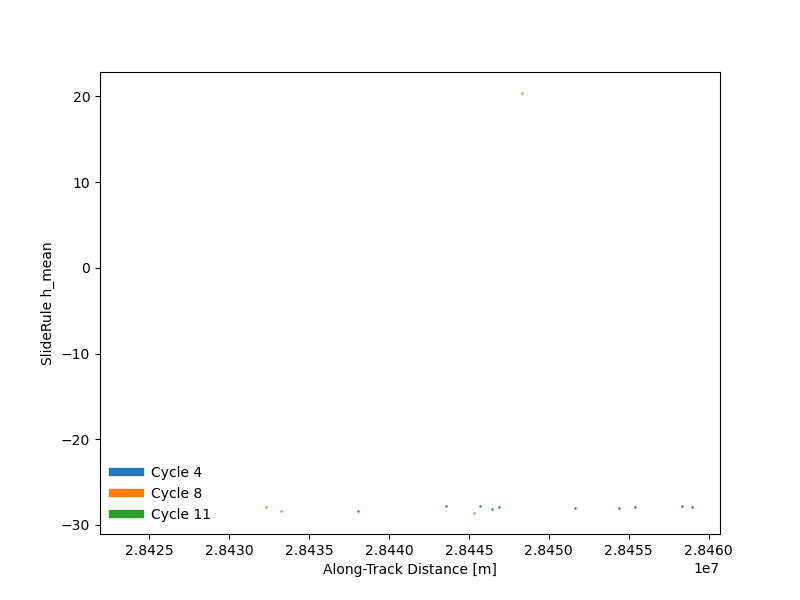

In [18]:
%matplotlib widget
# create figure axis
fig,ax2 = plt.subplots(num=2, figsize=(8,6))
# default is to skip cycles with significant off-pointing
cycles_plot(gdf, ax=ax2, kind='cycles', cycle_start=3, legend=True)

In [36]:
gdf

,geometry,distance,rms_misfit,h_sigma,dh_fit_dx,delta_time,pflags,rgt,n_fit_photons,spot,dh_fit_dy,segment_id,cycle,w_surface_window_final,h_mean,gt
2018-11-01 21:53:55.596761252,POINT (-100.54018 -75.21347),3.174730e+07,0.121991,0.013939,0.018472,2.634444e+07,0.0,523.0,100.0,1.0,0.0,1586911.0,1.0,3.0,12.298225,20.0
2018-11-01 21:53:55.599576612,POINT (-100.54028 -75.21329),3.174732e+07,0.137387,0.011749,0.032376,2.634444e+07,0.0,523.0,141.0,1.0,0.0,1586912.0,1.0,3.0,12.850929,20.0
2018-11-01 21:53:55.602401972,POINT (-100.54039 -75.21311),3.174734e+07,0.134493,0.014527,0.039114,2.634444e+07,0.0,523.0,114.0,1.0,0.0,1586913.0,1.0,3.0,13.567425,20.0
2018-11-01 21:53:55.887223748,POINT (-100.55109 -75.19531),3.174935e+07,0.091693,0.014891,0.007624,2.634444e+07,0.0,523.0,73.0,1.0,0.0,1587014.0,1.0,3.0,19.837289,20.0
2018-11-01 21:53:55.890037488,POINT (-100.55120 -75.19514),3.174937e+07,0.106501,0.010217,0.004879,2.634444e+07,0.0,523.0,117.0,1.0,0.0,1587015.0,1.0,3.0,19.956026,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-07-11 10:02:59.261449072,POINT (-101.76985 -75.22906),2.846880e+07,1.582817,0.072951,0.067015,1.112330e+08,4.0,271.0,474.0,5.0,0.0,1422141.0,12.0,3.0,44.224169,60.0
2021-07-11 10:02:59.264276448,POINT (-101.76997 -75.22924),2.846882e+07,1.615123,0.075986,0.032701,1.112330e+08,4.0,271.0,454.0,5.0,0.0,1422142.0,12.0,3.0,45.136867,60.0
2021-07-11 10:02:59.267092992,POINT (-101.77008 -75.22941),2.846884e+07,1.837044,0.082360,0.031468,1.112330e+08,4.0,271.0,498.0,5.0,0.0,1422143.0,12.0,3.0,45.688649,60.0
2021-07-11 10:02:59.269899136,POINT (-101.77019 -75.22959),2.846886e+07,2.059997,0.092358,0.026601,1.112330e+08,4.0,271.0,498.0,5.0,0.0,1422144.0,12.0,3.0,46.268272,60.0


## Load, Read and Analyze ERA5 Data
#### Author: Maria Lozano ()

First, import some required packages

In [ ]:
%matplotlib widget
import os
import ee
import geemap
import requests
import cftime
import numpy as np
import pandas as pd
import netCDF4 as nc
import datetime as dt
import rasterio as rio
import cartopy.crs as ccrs
import cartopy.util as cutil
import matplotlib.pyplot as plt

from matplotlib import cm
from rasterio import plot
from rasterio import warp
from shapely import geometry
from datetime import timedelta
from scipy.interpolate import griddata
from mpl_toolkits.mplot3d import axes3d
from cartopy.io.img_tiles import Stamen
from ipyleaflet import basemaps, basemap_to_tiles

In [ ]:
def nc_read(filename, variable):
    '''
    Read variable data from a NetCDF source
    :param filename:(string) complete path and file name
    :param variable: (string) name of variable
    :return: numpy array containing data
    '''
    
    data = nc.Dataset(filename)
    var = np.squeeze(data[variable][:])
    return var

In [ ]:
def return_variable_data(file, var, t_units):
    '''
    Return the time, latitude, longitude and variable values for the netcdf4 file
    :param file: (string) the complete path and file name
    :param var: (string) the variable name as defined in the NetCDF4 file.
    :param t_units: (string) the units for the time
    :return time: numpy array containing time data
    :return lats: numpy array containing latitude data
    :return lons: numpy array containing longitude data
    :return var: numpy array containing data for the variable of interest
    '''
    time = nc_read(file, 'time')
    lats = nc_read(file, 'latitude')
    lons = nc_read(file , 'longitude')
    var = nc_read(file, var)

    time.units = t_units
    time = nc.num2date(time, time.units)
    
    return time, lats, lons, var

In [ ]:
def spatial_extent_reduction(lat, lon, var):
    '''
    Reduces the variable data to the Pine Island Glacier Polynya region.
    :param lat: numpy array containing original latitude data
    :param lon: numpy array containing original longitude data
    :param lat: numpy array containing original variable data
    :return: The same input variable for the reduced region
    '''
    lat = lat[3:6]
    lon = lon[:-2]
    var = var[:,:,3:6,:-2]
    return lat, lon, var

In [ ]:
def load_data(var, spatial_reduction=0):
    '''
    File that loads the desired ERA5 data, and reduces the spatial extent if required.
    :param var: (string) variable name of interest
    :param spatial_reduction: (int) Can take values 0 or 1 where there is no spatial reduction for 0 and spatial reduction for 1
    :return: Processed ERA5 data for the specified variable of interest
    '''
    file = '/home/jovyan/Polynyas/data/ERA5/PineIslandPolynya_ERA5_data.nc'
    t_units = 'hours since 1900-01-01'
    time, lat, lon, var = return_variable_data(file, var, t_units)
    if spatial_reduction ==1:
        lat, lon, var = spatial_extent_reduction(lat, lon, var)
        return time, lat, lon, var
    else:
        return time, lat, lon, var
    

In [ ]:
def quick_visualisation(vardata, lon, lat, varname, date, filled_contours=0):
    '''
    Creates a contour plot for the variable data of interest.
    :param vardata: numpy array containing data for the variable of interest.
    :param lon: 1D numpy array containing longitude data 
    :param lat: 1D numpy array containing latitude data 
    :param varname: (string) the variable name for plotting
    :param date: (string) the time period spanned by the variable data
    :param filled_contours: set to 0 if no filled contours, set to 1 for filled contours
    '''
    
    lons, lats = np.meshgrid(lon, lat)
    plt.style.use('seaborn-bright')
    tiler = Stamen('terrain-background')
    mercator = tiler.crs

    fig = plt.figure(figsize=[14,14])
    ax = fig.add_subplot(1, 1, 1, projection=mercator)
    
    ax.set_extent([ -100, -102, -75.75, -74.25], ccrs.PlateCarree())

    if filled_contours==0:
        print("no filled contours")
    elif filled_contours==1:
        filled_c = ax.contourf(lons, lats, vardata,transform=ccrs.PlateCarree(),cmap='nipy_spectral')
        fig.colorbar(filled_c, orientation='horizontal')
    
    line_c = ax.contour(lons, lats, vardata, colors=['black'],transform=ccrs.PlateCarree())
    ax.clabel(line_c, colors=['black'], manual=False, inline=True, fmt=' {:.0f} '.format)
    geom = geometry.box(minx=-101.8,maxx=-100.5,miny=-75.25,maxy=-74.8)
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='r', edgecolor='black', alpha=0.3)
    ax.add_image(tiler, 6)
    ax.coastlines()
    ax.set_title('Quick Visualisation of {}'.format(varname)+'\n for {}'.format(date), fontsize=20, fontweight='bold', pad=20)


In [ ]:
def quick_visualisation_winds(u, v, lon, lat, varname, date):
    '''
    Creates a vector plot for the 10m wind.
    :param u: numpy array containing zonal wind component data
    :param v: numpy array containing meridional wind component data
    :param lon: 1D numpy array containing longitude data 
    :param lat: 1D numpy array containing latitude data 
    :param varname: (string) the variable name for plotting
    :param date: (string) the time period spanned by the variable data
    '''
    lons, lats = np.meshgrid(lon, lat)
    plt.style.use('seaborn-bright')
    tiler = Stamen('terrain-background')
    mercator = tiler.crs

    fig = plt.figure(figsize=[14,14])
    ax = fig.add_subplot(1, 1, 1, projection=mercator)
    
    ax.set_extent([ -100, -102, -75.75, -74.25], ccrs.PlateCarree())
    ax.quiver(lon,lat,u, v,units='xy', headwidth=3, transform=ccrs.PlateCarree())
    geom = geometry.box(minx=-101.8,maxx=-100.5,miny=-75.25,maxy=-74.8)
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='r', edgecolor='black', alpha=0.3)
    ax.add_image(tiler, 6)
    ax.coastlines()
    ax.set_title('Quick Visualisation of {}'.format(varname)+'\n for {}'.format(date), fontsize=20, fontweight='bold', pad=20)
    

In [ ]:
def quick_visualisation_ts(vardata, varname, time):
    '''
    Creates a timeseries plot for the variable of interest.
    :param vardata: numpy array containing the variable time series data
    :param varname: (string) the variable name for plotting
    :param time: (string) the time period spanned by the variable time series data
    '''
    plt.style.use('seaborn-bright')
    plt.figure(figsize=[20,10])
    time = pd.DataFrame(time)
    vardata = pd.DataFrame(vardata)
    vardata_weekly = vardata.rolling(7).mean()
    vardata_monthly = vardata.rolling(30).mean()
    
    plt.plot(vardata, color='k', linewidth=0.5, label='Daily MSLP')
    plt.plot(vardata_weekly, color='b', linewidth=1.5, label='Weekly MSLP')
    plt.plot(vardata_monthly, color='r', linewidth=1.5, label='Monthly MSLP')
    
    plt.title('Mean Sea Level Pressure over the Pine Island Polynya' , fontsize=22, fontweight='bold')
    plt.xlabel('Time', fontsize=20)
    plt.ylabel('Pressure (Pa)', fontsize=20)
    #plt.xticks(ticks=time, rotation=60, fontsize=22)
    plt.legend(fontsize=18)


In [ ]:
def return_date_index(date, time):
    '''
    Returns the index for the date of interest
    :param date: date of interest
    :param time: time data
    '''
    i = np.argwhere(time == date)
    i = np.ravel(i)
    return i[0]

In [ ]:
def temporal_mean(period, vardata, time, day=0):
    '''
    Takes the temporal mean of the variable data for the given period. For user friendliness, we can pick either 'weekly', 'monthly', 'yearly', 'overall' or 'seasonal' averages. 
    The 'seasonal' average will prompt the user to also include the 'season' of interest. For now, the function only calculates the temporal mean for the overall time period.
    :param period: (string) time period of interest
    :param vardata: numpy array containing variable data
    :param time: numpy array containing time data
    :param day: set to 0 if we are not extracting a single day and to 1 if we are.
    :return: temporal mean of variable data for time period chosen
    '''

    if period == 'overall':
        vardata_mn = np.mean(vardata, axis = 0)

        
    return vardata_mn[0,:,:]

In [ ]:
def spatial_mean(vardata, lat, lon):
    '''
    Calculates the spatial mean of the data for the Polynya bounding box region.
    '''
    lat, lon, vardata_ = spatial_extent_reduction(lat, lon, vardata)
    vardata_mn = np.mean(vardata_[:,0,:,:], axis = 2)
    vardata_mn = np.mean(vardata_mn[:,:], axis=1)
    
    return vardata_mn

Options for variables, and corresponding units and variable names
- Mean sea level pressure (Pa): 'msl'
- Mean surface latent heat flux (W m**(-2)): 'mslhf'
- Mean surface sensible heat flux (W m**(-2)): 'msshf'
- Surface sensible heat flux (J m**(-2)): 'sshf'
- Sea surface temperature (K): 'sst'
- Zonal wind 10m above surface (m/s): 'u10'
- Meridional wind 10m above surface (m/s): 'v10'

Note: If you are unfamiliar with heat fluxes, a negative heat flux means heat is flowing from the surface to the atmosphere, a positive heat flux means heat is flowing from the atmosphere to the surface.

### Let's look at some variables of interest.
#### First let's set the time frame of interest:

In [ ]:
# Specify the period of interest to a specific day, weekly mean, monthly mean or yearly mean
period = "day"
if period == "day":
    set_date = cftime.DatetimeGregorian(2019, 4, 15, 15, 0, 0, 0, has_year_zero=False)

### Let's investigate the mechanical driving of the Polynya
#### First we loop at the mean sea level pressure

In [ ]:
# Load the data for the variable of interest
var = 'msl'
varname = 'Mean Sea Level Pressure (Pa)'
time, lats, lons, vardata = load_data(var)

#The following code isn't working and can't figure it out so will do this the non-modular way for now
# Do some data extraction based on the time frame of interest
#date_i, time_, vardata_ = temporal_mean(period, vardata, time, day= set_date)

#extract index for date of interest set_date
date_i = return_date_index(set_date, time)

#plot the msl data for this day
quick_visualisation(vardata[date_i,0,:,:], lons, lats, varname, time[date_i], filled_contours = 0)


#### Which can be further interpreted by the wind vectors

In [ ]:
#set wind vector variable names
var_u = 'u10'
var_v = 'v10'
varname = '10m Winds'
#extract wind data
time, lats, lons, vardata_u = load_data(var_u)
time, lats, lons, vardata_v = load_data(var_v)
#visualize wind data
quick_visualisation_winds(vardata_u[date_i,0,:,:], vardata_v[date_i,0,:,:], lons, lats, varname, time[date_i])

### Now we can look at some energy fluxes

In [ ]:
#define the heat flux variable names of interest
lh = 'mslhf'
sh = 'msshf'

lhname = 'Mean Surface Latent Heat Flux (W m**(-2))'
shname = 'Mean Surface Sensible Heat Flux (W m**(-2))'

# Load the data for the variables of interest
time, lats, lons, lhdata = load_data(lh)
time, lats, lons, shdata = load_data(sh)

#return index for date of interest, set_date
date_i = return_date_index(set_date, time)

#calculate the net heat flux from the sensible and latent heat fluxes
nethf = (lhdata[date_i,0,:,:] + shdata[date_i,0,:,:])
nethfname = 'Net Mean Surface Heat Flux (W m**(-2))'

#visualize the results
quick_visualisation(lhdata[date_i,0,:,:], lons, lats, lhname, time[date_i], filled_contours = 1)
quick_visualisation(shdata[date_i,0,:,:], lons, lats, shname, time[date_i], filled_contours = 1)
quick_visualisation(nethf, lons, lats, nethfname, time[date_i], filled_contours = 1)

### So it seems like the surface heat flux variables do not necessarily capture the Polynya
#### Let's investigate whether any features are captured on average

In [ ]:
#define the heat flux variable names of interest
lh = 'mslhf'
sh = 'msshf'

lhname = 'Mean Surface Latent Heat Flux (W m**(-2))'
shname = 'Mean Surface Sensible Heat Flux (W m**(-2))'

# Load the data for the variables of interest
time, lats, lons, lhdata = load_data(lh)
time, lats, lons, shdata = load_data(sh)

# calculate the overall temporal mean for the data
lhdata_mn = temporal_mean('overall', lhdata, time, day=0)
shdata_mn = temporal_mean('overall', shdata, time, day=0)

#calculate the net heat flux from the sensible and latent heat fluxes
nethf_mn = (lhdata_mn[:,:] + shdata_mn[:,:])
nethfname = 'Net Mean Surface Heat Flux (W m**(-2))'

#visualize the results
quick_visualisation(lhdata_mn, lons, lats, lhname, 'Mean for January 2018 - March 2022', filled_contours = 1)
quick_visualisation(shdata_mn, lons, lats, shname, 'Mean for January 2018 - March 2022', filled_contours = 1)
quick_visualisation(nethf_mn, lons, lats, nethfname, 'Mean for January 2018 - March 2022', filled_contours = 1)

So it's become obvious that while the ERA5 data may help us understand some of the physical mechanisms that contribute to the formation of the Polynya, it cannot resolve the heat flux dynamics over the region. An extension would be to look at the time series of heat flux in the Polynya region and see if the behaviour of the time series mimicks the observed behaviour of the Polynya.

#### Given that the ERA5 sea level pressure and winds are more interpretable, we can look at the time series for the Polynya region and assess whether the behaviour mimicks what is observed. 

In [ ]:
# Load the data for the variable of interest
var = 'msl'
varname = 'Mean Sea Level Pressure (Pa)'
time, lats, lons, vardata = load_data(var)
vardata_mn = spatial_mean(vardata, lats, lons)

quick_visualisation_ts(vardata_mn, varname, time)


### Three dimensional plots with ICESat-2 Tracks

Here we define the dataCollector class based off of Philipp Arndt's code seen in visualisation tutorial. We define it within the code since there were issues importing the class from an outside python script.

In [ ]:
class dataCollector:
    def __init__(self, beam=None, oaurl=None, track=None, date=None, latlims=None, lonlims=None, verbose=False):
        if (beam is None) or ((oaurl is None) and (None in [track, date, latlims, lonlims])):
            raise Exception('''Please specify a beam and 
            - either: an OpenAltimetry API url, 
            - or: a track, date, latitude limits and longitude limits.''')
        else:
            if oaurl is not None:
                url = oaurl
                tofind = '&beamName='
                ids = url.find(tofind)
                while ids>-1:
                    url = url.replace(url[ids:ids+len(tofind)+4],'')
                    ids = url.find(tofind)
                iprod = url.find('/atl')
                url = url.replace(url[iprod:iprod+6],'/atlXX')
                url += tofind + beam + '&client=jupyter'

                idate = url.find('date=') + len('date=')
                date = url[idate:idate+10]
                itrack = url.find('trackId=') + len('trackId=')
                trackend = url[itrack:].find('&')
                track = int(url[itrack:itrack+trackend])
                bb = []
                for s in ['minx=', 'maxx=', 'miny=', 'maxy=']:
                    ids = url.find(s) + len(s)
                    ide = url[ids:].find('&')
                    bb.append(float(url[ids:ids+ide]))
                lonlims = bb[:2]
                latlims = bb[2:]
            elif None not in [track, date, latlims, lonlims]:
                url = 'https://openaltimetry.org/data/api/icesat2/atlXX?'
                url += 'date={date}&minx={minx}&miny={miny}&maxx={maxx}&maxy={maxy}&trackId={track}&beamName={beam}'.format(
                        date=date,minx=lonlims[0],miny=latlims[0],maxx=lonlims[1],maxy=latlims[1],track=track,beam=beam)
                url += '&outputFormat=json&client=jupyter'
            
            self.url = url
            self.date = date
            self.track = track
            self.beam = beam
            self.latlims = latlims
            self.lonlims = lonlims
            if verbose:
                print('OpenAltimetry API URL:', self.url)
                print('Date:', self.date)
                print('Track:', self.track)
                print('Beam:', self.beam)
                print('Latitude limits:', self.latlims)
                print('Longitude limits:', self.lonlims)
                
    def requestData(self, verbose=False): 
        if verbose:
            print('---> requesting ATL03 data...',end='')
        product = 'atl03'
        request_url = self.url.replace('atlXX',product)
        data = requests.get(request_url).json()
        lat, lon, h, confs = [], [], [], []
        for beam in data:
            for confidence in beam['series']:
                for p in confidence['data']:
                    confs.append(confidence['name'])
                    lat.append(p[0])
                    lon.append(p[1])
                    h.append(p[2])
        self.atl03 = pd.DataFrame(list(zip(lat,lon,h,confs)), columns = ['lat','lon','h','conf'])
        if verbose:
            print(' Done.')
            
            print('---> requesting ATL06 data...',end='')
        product = 'atl06'
        request_url = self.url.replace('atlXX',product)
        data = requests.get(request_url).json()
        self.atl06 = pd.DataFrame(data['series'][0]['lat_lon_elev'], columns = ['lat','lon','h'])
        if verbose:
            print(' Done.')
            
            print('---> requesting ATL07 data...',end='')
        product = 'atl07'
        request_url = self.url.replace('atlXX',product)
        data = requests.get(request_url).json()
        self.atl07 = pd.DataFrame(data['series'][0]['lat_lon_elev'], columns = ['lat','lon','h'])
        if verbose:
            print(' Done.')
            
            print('---> requesting ATL08 data...',end='')
        product = 'atl08'
        request_url = self.url.replace('atlXX',product)
        data = requests.get(request_url).json()
        self.atl08 = pd.DataFrame(data['series'][0]['lat_lon_elev_canopy'], columns = ['lat','lon','h','canopy'])
        if verbose:
            print(' Done.')

In [ ]:
try:
    ee.Initialize()
except: 
    ee.Authenticate()
    ee.Initialize()

In [ ]:
def data_from_oa_url(url,gtx):
    mydata = dataCollector(oaurl=url,beam=gtx)
    mydata.requestData()
    return (mydata)

We define a function to extract the satellite data we are interested in 

In [ ]:
#define url and gtx we desire
PIG_20201007_url = 'http://openaltimetry.org/data/api/icesat2/atl08?date=2020-10-07&minx=-101.06993207685464&miny=-75.06319452393107&maxx=-100.2946192252&maxy=-74.74165227279721&trackId=210&beamName=gt3r&beamName=gt3l&beamName=gt2r&beamName=gt2l&beamName=gt1r&beamName=gt1l&outputFormat=json'
PIG_20201007_gtx = 'gt2r'
#download the data 
PIG_20201007_data = data_from_oa_url(PIG_20201007_url, PIG_20201007_gtx)
#extract the data for ATL06 including, longitude, latitude and height
atl06_data = PIG_20201007_data.atl06
atl06_lat = atl06_data['lat']
atl06_lon = atl06_data['lon']
atl06_h = atl06_data['h']

#define a meshgrid for the region
new_lons, new_lats = np.meshgrid(atl06_lon, atl06_lat)

Given that we want to visualize this data together with the ERA5 data, we also load the ERA5 data for mean sea level pressure for the same date and interpolate it to the same grid size to be able to more easily code a visualization.

In [ ]:
var = 'msl'
varname = 'Mean Sea Level Pressure (Pa)'
time, lat, lon, vardata = load_data(var)
old_lon, old_lat = np.meshgrid(lon, lat)


date_i = return_date_index(set_date, time)

vardata_old = vardata[date_i,0,:,:]
time_ = time[date_i]

#interp
new_grid=griddata((old_lon.flatten(),old_lat.flatten()),vardata_old.flatten() , (new_lons,new_lats),method='cubic')


#### The rest is a work in progress

In [ ]:
fig    = plt.figure()
ax     = fig.gca(projection='3d')

#x      = np.linspace(0, 1, 100)
#X, Y   = np.meshgrid(x, x)
#levels = np.linspace(-0.1, 0.4, 100)  #(z_min,z_max,number of contour),

#a=0
#b=1
#c=2
#Z1 = a+.1*np.sin(2*X)*np.sin(4*Y)
#Z2 = b+.1*np.sin(3*X)*np.sin(4*Y)
#Z3 = c+.1*np.sin(4*X)*np.sin(5*Y)

#plt.contourf(old_lon, old_lat, vardata_old, levels =100, zdir='z',cmap=plt.get_cmap('nipy_spectral'))
#line_c = plt.contour(old_lon, old_lat, vardata_old, colors=['black'])
#ax.clabel(
#        line_c,  # Typically best results when labelling line contours.
#        colors=['black'],
#        manual=False,  # Automatic placement vs manual placement.
#        inline=True,  # Cut the line where the label will be placed.
#        fmt=' {:.0f} '.format,  # Labes as integers, with some extra space.
#    )
#plt.p

plt.contourf(new_lons, new_lats, new_grid, levels =100, cmap=plt.get_cmap('nipy_spectral'))
#line_c = plt.contour(new_lons, new_lats, new_grid, colors=['black'])
#plt.clabel(
#        line_c,  # Typically best results when labelling line contours.
#        colors=['black'],
 #       manual=False,  # Automatic placement vs manual placement.
  #      inline=True,  # Cut the line where the label will be placed.
   #     fmt=' {:.0f} '.format,  # Labes as integers, with some extra space.
    #)
#plt.plot(atl06_lon, atl06_lat, atl06_h, 'red')
#plt.contourf(X, Y,Z3, levels=c+levels,cmap=plt.get_cmap('rainbow'))
#ax.set_xlim3d(0, 1)
#ax.set_ylim3d(0, 1)
#ax.set_zlim3d(0, 2)

plt.show()

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot3D(atl06_lon, atl06_lat, atl06_h, 'red')
